## Imports and definitions


### Imports

In [29]:
import os
import re
import sys
import glob
import csv
import shutil
from datetime import datetime
from collections import defaultdict

import numpy as np
import numpy.ma as ma
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.colors import Normalize

from astropy.io import fits
from astropy.io.fits import getdata
import astropy.units as u
import astropy.constants as const
from astropy.time import Time
from astropy.coordinates import EarthLocation, SkyCoord

from scipy.ndimage import rotate, gaussian_filter1d, maximum_filter1d
from scipy.optimize import curve_fit
from scipy.interpolate import interp1d
from scipy.signal import medfilt, find_peaks, detrend
from scipy.special import wofz
from scipy import stats
from scipy.interpolate import CubicSpline

from lmfit.models import VoigtModel, ExponentialModel, SplineModel, LinearModel, GaussianModel, PolynomialModel, ConstantModel
from lmfit import report_fit

### Grism Utils v2

In [30]:
import importlib
import grism_utils_v2
importlib.reload(grism_utils_v2)
from grism_utils_v2 import spectrum

### Functions

In [31]:
def get_obs_time(img_file):
    """
    Return astropy Time object for a FITS file.
    """
    with fits.open(img_file) as hdul:
        hdr = hdul[1].header  # you already use extension 1
        date_obs = hdr.get("DATE-OBS")

        if date_obs is None:
            raise ValueError(f"No DATE-OBS in {img_file}")

    return Time(date_obs, format='isot', scale='utc')

# def calib_match(img_file, calib_list):
#     """
#     Return matching calibration image based on time proximity
#     """
#     sci_time = Time(get_obs_time(img_file).isot, scale = 'utc')
#     calib_times = Time([get_obs_time(calib_file).isot for calib_file in calib_list], scale = 'utc')
#     dt = np.abs((calib_times - sci_time).to('s').value)
#     idx = np.argmin(dt)

#     calib_file_match = calib_list[idx]

#     return calib_file_match

def calib_match_spectrum(img_file, calib_spectra):
    """
    Match a science image to the closest calibration spectrum
    based on observation time.

    Parameters
    ----------
    img_file : str
        Science image filename
    calib_spectra : list
        List of calibration spectrum objects (e.g. QHY_calib_spectra)

    Returns
    -------
    best_match : spectrum object
        Calibration spectrum with closest observation time
    """

    # --- science time ---
    sci_time = Time(get_obs_time(img_file).isot, scale='utc')

    good_calib_spectra = [S for S in calib_spectra if not S.flagged]

    # --- calibration times from class headers ---
    calib_times = []

    for S in good_calib_spectra:
        try:
            # Adjust this depending on how your header is stored
            t = Time(S.hdr['DATE-OBS'], format='isot', scale='utc')
        except Exception:
            # fallback if stored differently
            t = Time(S.obs_date, scale='utc')

        calib_times.append(t)

    calib_times = Time(calib_times)

    # --- compute time differences ---
    dt = np.abs((calib_times - sci_time).to('s').value)

    # --- best match ---
    idx = np.argmin(dt)

    return good_calib_spectra[idx]
    

## LRG or HRG? (Make sure to select desired option)

In [4]:
filter = 'hrg'
# filter = 'lrg'

## Load Science + Calibration Data

In [8]:
# Please paste in your own directories here for saving output files
out_folder = os.path.expanduser('~/Desktop/Code/')
drive_path = os.path.expanduser('~/gdrive/Shared Drives/MACRO-Be/resources/Data') #Comment this out if you do not have drive mounted

#Specify a basepath
# basepath = os.path.expanduser('~/Desktop/Code/reduced_data/')
basepath = os.path.expanduser('~/gdrive/Shared drives/MACRO-Be/resources/Data/raw_data/')
QHY_calib_path = os.path.expanduser('~/Desktop/Code/raw_data/HR3454_Calib_Test/') # Specify path to QHY calibration files


# /Users/research/Desktop/RLMT/2026-01-21

## Priority Targets
# target = 'V442_And'
# target = '69_Ori'
# target = 'Lam_Eri'

## Primary Targets
# target = 'V742_Cas'
# target = ['Gamma_Cas', 'Gam_Cas']
# target = 'phi_and'
# target = 'Phi_Per'
# target = 'Psi_Per'
# target = 'CT_Cam'
# target = 'V1369_Ori'
# target = ['Zeta_Tau', 'Zet_Tau']
# target = 'AX_Mon'
# target = 'QQ_Gem'
target = 'Bet_Cmi'
# target = 'RY_Sct'
# target = 'HD_44637'
# target = 'pi_Aqr'

## Oe Stars
# target = ['BD+59_553', 'HD_17520']
# target = 'x_per'
# target = ['PZ_Gem', 'HD_45314']
# target = ['BN_Gem', 'HD_60848']
# target = '68_Cyg'

## Survey Targets
# target = 'Alcyone'
# target = 'HD_23800'
# target = 'V586_Per'
# target = '56_Eri'
# target = '2_Ori'
# target = '105_Tau'
# target = '12_Aur'
# target = 'HD_49787'
# target = 'HD_53416'
# target = '5_Cnc'
# target = 'kap_Dra'
# target = 'tet_CrB'
# target = '51_Oph'
# target = 'V3903_Sgr'
# target = 'HD_179343'
# target = 'HD_189689'
# target = 'HD_201522'
# target = 'ups_cyg'
# target = 'V2162_Cyg'
# target = '25_Peg'
# target = 'HD_216057'
# target = '14_Lac'

## Calibration Targets
# target = 'HR_718'
# target = 'HR_4468'
# target = 'HR_3454'
# target = 'HR_4963

## Spring Targets
# target = 'bet_mon_A'
# target = 'HD_50658'
# target = 'phi_Leo'
# target = 'V763_Mon'
# target = 'HIP_49583' # eta Leonis / HD87737
# target = 'HD_50658'
# target = '*' # Select this if no specific target
# target = 'PLEIONE'
# target = '11_Cam'
# target = 'CQ_UMa'
# target = 'phi_and'
# target = 't_crb'
# target = 'rho_oph_c'
# target = 'G191-B2B'
# target = 'BT_CMi'

## Other
# target = 'EV_Lac'
# target = 'AD_Leo'
# target = 'BU_Tau'
# target = 'HD_36958'
# target = 'HD_37061'
# target = 'HD_37058'
# target = 'SN_1971G'
# target = 'Spica'
# target = 'bet_per'
# target = 'SN_2026acd'
# target = 'V2304_Oph'
# target = '2MASS_J16255459-2330291'
# target = '2_Vul'

## PHYS440 Targets
# target = 'HD_23753'
# target = 'HD_9823'
# target = 'Feige_80'
# target = 'HD_21427'
# target = 'HD_122064'
# target = 'Pi1_Ursae_Majoris'
# target = 'Rho_Geminorum'
# target = 'Upsilon_Orionis'
# target = '2_Camelopardalis'
# target = 'BD-03_2870'
# target = 'HD_8671'
# target = '16_Lib'
# target = 'NGC_4151'
# target = 'NGC_4388'
# target = 'NGC_4395'
# target = 'SZ_Uma'
# target = 'HD_75632B'

# calib_targets = ['hr_718', 'hr_3454','hr_4963']
calib_targets = ['hr_718', 'hr_3454', 'hr_4468', 'hr_4963', 'Alpha_Lyr']
# calib_targets = ['hr_3454', 'hr_4963']
# calib_targets = ['hr_718', 'hr_4468']
# calib_targets = ['hr_718']
# calib_targets = ['hr_3454']
# calib_targets = ['hr_4963']

# ----- FLEXIBLE HANDLING -----
if isinstance(target, str):
    targets = [target]
else:
    targets = list(target)

# Build regex to match any target alias safely
target_pattern = re.compile(
    r"(?<![A-Za-z0-9])(" + "|".join(re.escape(t) for t in targets) + r")(?![A-Za-z0-9])",
    re.IGNORECASE
)

calib_target_pattern = re.compile(
    r"(?<![A-Za-z0-9])(" + "|".join(re.escape(t) for t in calib_targets) + r")(?![A-Za-z0-9])",
    re.IGNORECASE
)

# Create image and calibration file lists

img_files = []
calib_img_files = []
QHY_calib_img_files = []

if filter =='hrg':
    patterns = [
        f"{basepath}/2025*/*hrg*.fz",
        f"{basepath}/2026*/*hrg*.fz"  # broad pattern
    ]
elif filter == 'lrg':
    patterns = [
        f"{basepath}/2025*/*lrg*.fz",
        f"{basepath}/2026*/*lrg*.fz"  # broad pattern
    ]

for pattern in patterns:
    for m in glob.glob(pattern):
        base = os.path.basename(m)
        if re.search(target_pattern, base):
            img_files.append(m)

img_files = sorted(img_files)
n_img_files = len(img_files)

for pattern in patterns:
    for m in glob.glob(pattern):
        base = os.path.basename(m)
        if re.search(calib_target_pattern, base):
            calib_img_files.append(m)

for m in glob.glob(f"{QHY_calib_path}/*{filter}*.fz"):
    QHY_calib_img_files.append(m)

calib_img_files = sorted(calib_img_files)
n_calib_files = len(calib_img_files)

QHY_calib_img_files = sorted(QHY_calib_img_files)
n_QHY_calib_files = len(QHY_calib_img_files)

print('')
print(f'Found {n_img_files} science images')
print(f'Found {n_calib_files} calibration images')
print(f'Found {n_QHY_calib_files} QHY calibration images')
print('')


Found 142 science images
Found 898 calibration images
Found 0 QHY calibration images



In [9]:
# Filter by centering
centered_list = []

for i in range(len(img_files)):
    hdu = fits.open(img_files[i])
    hdul = hdu[1].header
    centered = hdul["CENTERED"]
    if centered == False:
        try:
            winstabl = hdul["WINSTABL"]
            centered_list.append(winstabl)
        except: 
            centered_list.append(centered)
    else:
        centered_list.append(centered)

i = 0
while i < len(centered_list):
  if centered_list[i] == False:
    # print(f'Not centered, deleting image: {img_files[i]}')
    del img_files[i]
    del centered_list[i]
    continue
  else:
    i += 1

calib_centered_list = []

for i in range(len(calib_img_files)):
    hdu = fits.open(calib_img_files[i])
    hdul = hdu[1].header
    centered = hdul["CENTERED"]
    if centered == False:
        try:
            winstabl = hdul["WINSTABL"]
            calib_centered_list.append(winstabl)
        except: 
            calib_centered_list.append(centered)
    else:
        calib_centered_list.append(centered)

# for i in range(len(img_files)):
#   print(img_files[i], f'Centering = {centered_list[i]}')

i = 0
while i < len(calib_centered_list):
  if calib_centered_list[i] == False:
    # print(f'Not centered, deleting image: {img_files[i]}')
    del calib_img_files[i]
    del calib_centered_list[i]
    continue
  else:
    i += 1

#Print the result
print(f"{len(img_files)} of {n_img_files} science images are centered")
print(f"{len(calib_img_files)} of {n_calib_files} calibration images are centered")

112 of 142 science images are centered
769 of 898 calibration images are centered


In [10]:
# # Filter by centering (only check CENTERED keyword, not WINSTABL)
# centered_list = []

# for i in range(len(img_files)):
#     hdu = fits.open(img_files[i])
#     hdul = hdu[1].header
#     centered = hdul["CENTERED"]
#     centered_list.append(centered)

# i = 0
# while i < len(centered_list):
#   if centered_list[i] == False:
#     # print(f'Not centered, deleting image: {img_files[i]}')
#     del img_files[i]
#     del centered_list[i]
#     continue
#   else:
#     i += 1

# calib_centered_list = []

# for i in range(len(calib_img_files)):
#     hdu = fits.open(calib_img_files[i])
#     hdul = hdu[1].header
#     centered = hdul["CENTERED"]
#     calib_centered_list.append(centered)

# QHY_calib_centered_list = []

# for i in range(len(QHY_calib_img_files)):
#     hdu = fits.open(QHY_calib_img_files[i])
#     hdul = hdu[1].header
#     centered = hdul["CENTERED"]
#     QHY_calib_centered_list.append(centered)

# # for i in range(len(img_files)):
# #   print(img_files[i], f'Centering = {centered_list[i]}')

# i = 0
# while i < len(calib_centered_list):
#   if calib_centered_list[i] == False:
#     # print(f'Not centered, deleting image: {img_files[i]}')
#     del calib_img_files[i]
#     del calib_centered_list[i]
#     continue
#   else:
#     i += 1

# #Print the result
# print(f"{len(img_files)} of {n_img_files} science images have CENTERED = True")
# print(f"{len(calib_img_files)} of {n_calib_files} calibration images have CENTERED = True")
# print(f"{len(QHY_calib_img_files)} of {n_QHY_calib_files} QHY calibration images have CENTERED = True")

In [11]:
# # Time sorting optimization for calibration images (not running this for calib testing)

# science_times = Time([get_obs_time(f).isot for f in img_files], scale='utc')
# calib_times   = Time([get_obs_time(f).isot for f in calib_img_files], scale='utc')

# # Track which calibration files are actually used
# used_calibs = set()

# for sci_file, sci_time in zip(img_files, science_times):
#     # Time differences in seconds
#     dt = np.abs((calib_times - sci_time).to('s').value)

#     idx = np.argmin(dt)
#     used_calibs.add(calib_img_files[idx])

#     print(f"{os.path.basename(sci_file)} → "
#           f"{os.path.basename(calib_img_files[idx])} "
#           f"({dt[idx]/60:.1f} min)")
    
# filtered_calib_img_files = sorted(used_calibs)
# filtered_calib_times  = Time([get_obs_time(f).isot for f in filtered_calib_img_files], scale='utc')

# print('')
# print(f"Kept {len(filtered_calib_img_files)} out of {len(calib_times)} calibration files")

## (Optional) Display Images + Statistics

/Users/joshuamarine/gdrive/Shared drives/MACRO-Be/resources/Data/raw_data/2025-10-29/mjc_Zet_Tau_hrg_120s_2025-10-29T08-25-27.fts.fz


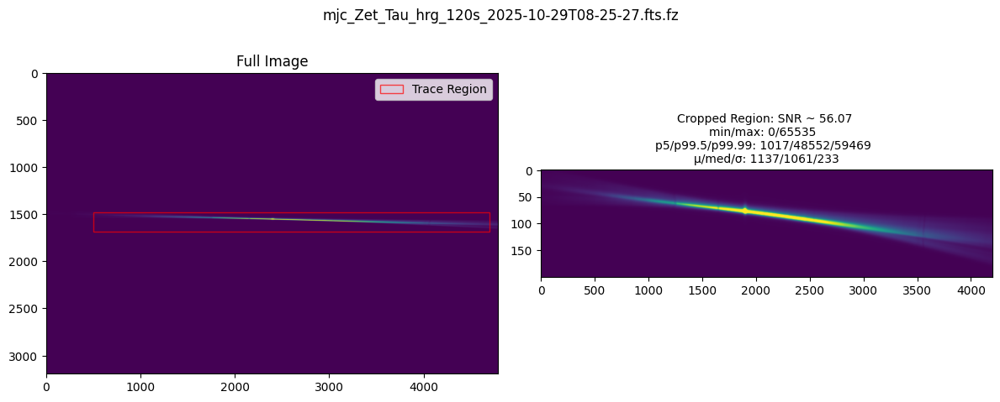

In [73]:
from matplotlib.patches import Rectangle
from astropy.stats import sigma_clipped_stats

i_start = 0
i_end = 1 # First i_end - 1 images
# i_end = len(img_files) # All images

for grism_image in img_files[i_start:i_end]:

    if filter == 'hrg':
        xstart = 500
        ystart = 1580
        xwidth = 4200
        ywidth = 200
    
    if filter == 'lrg':
        xstart = 1500
        ystart = 1760
        xwidth = 2500
        ywidth = 150

    print(grism_image)

    image_data = fits.getdata(grism_image)

    ymin = ystart - int(ywidth/2)
    ymax = ystart + int(ywidth/2)

    # Crop region
    cropped_image_data = image_data[
        ymin: ymax,
        xstart : xstart + xwidth
    ]

    # --- Statistics ONLY on cropped region ---
    mean_sc, med_sc, std_sc = sigma_clipped_stats(
        cropped_image_data, sigma=3.0, maxiters=5
    )

    vmin_p, vmax_p = np.percentile(cropped_image_data, (5, 99.5))
    p9999 = np.percentile(image_data, 99.99)
    dmin = float(np.nanmin(cropped_image_data))
    dmax = float(np.nanmax(cropped_image_data))

    # --- Create figure with two panels ---
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # -------- Left: full image --------
    ax_full = axes[0]
    ax_full.imshow(
        image_data,
        cmap="viridis",
        vmin=vmin_p,
        vmax=vmax_p
    )
    ax_full.set_title("Full Image")

    rect = Rectangle(
        (xstart, ymin),
        xwidth,
        ywidth,
        facecolor='none',
        edgecolor='red',
        alpha=0.7,
        label='Trace Region'
    )
    ax_full.add_patch(rect)
    ax_full.legend()

    # -------- Right: cropped image --------
    ax_crop = axes[1]
    ax_crop.imshow(
        cropped_image_data,
        cmap="viridis",
        vmin=vmin_p,
        vmax=vmax_p
    )

    # Stats shown as the title (no overlap possible)
    stats_title = (
        f"Cropped Region: SNR ~ {p9999 / med_sc:.2f} \n"
        f"min/max: {dmin:.0f}/{dmax:.0f}  \n"
        f"p5/p99.5/p99.99: {vmin_p:.0f}/{vmax_p:.0f}/{p9999:.0f}  \n"
        f"μ/med/σ: {mean_sc:.0f}/{med_sc:.0f}/{std_sc:.0f}"
    )
    ax_crop.set_title(stats_title, fontsize=10)
    ax_crop.set_aspect(5)

    # Figure title
    fig.suptitle(grism_image.split("/")[-1])

    plt.tight_layout()
    plt.show()

## Calculate Radial Velocity Wavelength Corrections

In [74]:
# Query Simbad for the recessional velocity of the target

!pip3 install astroquery

from astroquery.simbad import Simbad

# Reset to default fields
Simbad.reset_votable_fields()

# List available votable fields
print("Available votable fields:")
print(Simbad.list_votable_fields())

Simbad.add_votable_fields('rvz_radvel')

star_name = targets[0]
result_table = Simbad.query_object(star_name)

if result_table is None:
    print(f"No results found for {star_name}.")
else:
    print("Returned columns:", result_table.colnames)

    if 'rvz_radvel' in result_table.colnames:
        rv = result_table['rvz_radvel'][0]
        if rv is None:
            print('')
            print(f"No radial (recessional) velocity available for {star_name}.")
            print('')
        else:
            print('')
            print(f"The radial (recessional) velocity of {star_name} is {rv} km/s.")
            print('')
    else:
        print("Radial velocity column not found in the result. Available columns are:")
        print(result_table.colnames)

Python(90556) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.



[notice] A new release of pip is available: 26.0.1 -> 26.1
[notice] To update, run: pip install --upgrade pip
Available votable fields:
    name    ...     type   
----------- ... -----------
mesDiameter ...       table
      mesPM ...       table
     mesISO ...       table
     mesSpT ...       table
  allfluxes ...       table
      ident ...       table
       flux ...       table
   mesOtype ...       table
     mesPLX ...       table
   otypedef ...       table
        ... ...         ...
          K ... filter name
          u ... filter name
          g ... filter name
          r ... filter name
          i ... filter name
          z ... filter name
          G ... filter name
      F150W ... filter name
      F200W ... filter name
      F444W ... filter name
Length = 116 rows
Returned columns: ['main_id', 'ra', 'dec', 'coo_err_maj', 'coo_err_min', 'coo_err_angle', 'coo_wavelength', 'coo_bibcode', 'rvz_radvel', 'matched_id']

The radial (recessional) velocity of Zeta_Tau is 

In [75]:
# Calculate earth + target recessional velocity corrections with astropy for rigel based on DATE-OBS in header

target_velocity = rv*u.km/u.s
radial_velocities = []
wavelength_corrections = []
times = []

target_name = targets[0].replace('_', ' ')

for i in range(len(img_files)):
  # Get the DATE-OBS from the header
  hdu = fits.open(img_files[i])
  hdul = hdu[1].header
  date_obs = hdul['DATE-OBS']
  # print(date_obs)

  # Should really pull the target from the header...
  target_star = SkyCoord.from_name(target_name)
  # print(target)

  # Get the observatory location
  obs_loc = EarthLocation.of_site('Winer')
  # print(obs_loc)

  # Convert date_obs to astropy time
  t = Time(date_obs, format='isot', scale='utc', location=obs_loc)
  times.append(t)
  # print(t)

  radial_vel_correction = target_star.radial_velocity_correction(obstime=t).to('km/s')
  # print("Earth motion velocity: ", radial_vel_correction)
  # print("Target velocity: ", target_velocity)

  c = 299792.458 * u.km/u.s  # Speed of light in km/s
  wavelength_correction = 1 + (radial_vel_correction + target_velocity) / c
  # print("Total Radial Velocity", radial_vel_correction + target_velocity)
  # print("Wavelength correction: ", wavelength_correction)

  radial_velocities.append(radial_vel_correction + target_velocity)
  wavelength_corrections.append(wavelength_correction)

for i in range(len(radial_velocities)):
  print(f'Date and Time of Observation: {times[i]}')
  print(f'Radial Velocity Correction: {radial_velocities[i]}')
  print(f'Wavelength Correction: {wavelength_corrections[i]}')
  if wavelength_corrections[i] < 1:
    print('Light is blue shifted')
  else:
    print('Light is red shifted')
  print('')

Date and Time of Observation: 2025-10-29T08:25:27.170
Radial Velocity Correction: 42.487241286874095 km / s
Wavelength Correction: 1.0001417221819733
Light is red shifted

Date and Time of Observation: 2025-10-29T08:28:42.710
Radial Velocity Correction: 42.48193385264801 km / s
Wavelength Correction: 1.0001417044782783
Light is red shifted

Date and Time of Observation: 2025-10-29T08:31:58.210
Radial Velocity Correction: 42.47658956843 km / s
Wavelength Correction: 1.000141686651665
Light is red shifted

Date and Time of Observation: 2025-10-29T08:49:17.720
Radial Velocity Correction: 42.447574313941445 km / s
Wavelength Correction: 1.000141589867194
Light is red shifted

Date and Time of Observation: 2025-10-29T08:35:13.720
Radial Velocity Correction: 42.47120800472784 km / s
Wavelength Correction: 1.0001416687007008
Light is red shifted

Date and Time of Observation: 2025-10-29T08:36:59.180
Radial Velocity Correction: 42.4682901006483 km / s
Wavelength Correction: 1.0001416589676204


## Derive QHY Wavelength Solutions

Moon Angle & Phase: 72.34 degrees, 61.42 %


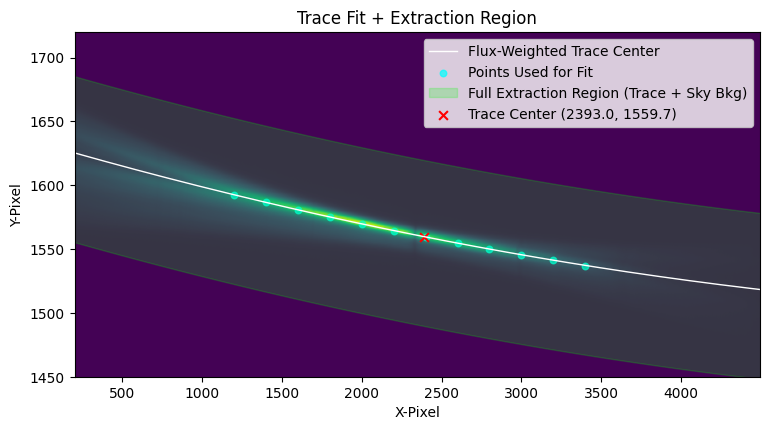

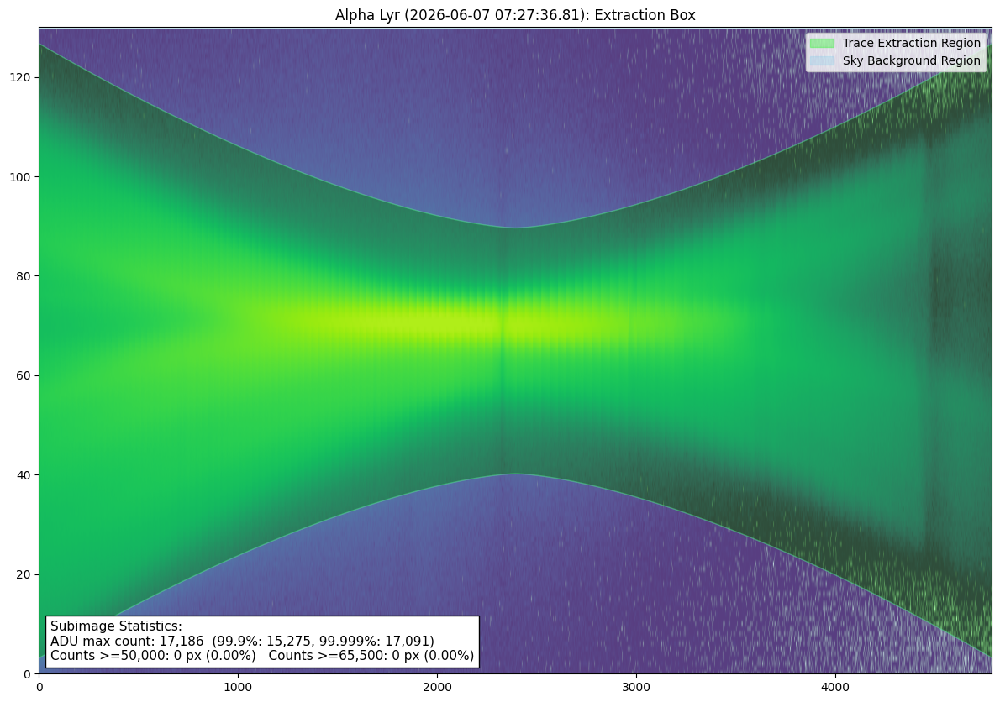

/Users/joshuamarine/Desktop/Code/Be-Stars/grism_utils_v2.py:1350: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


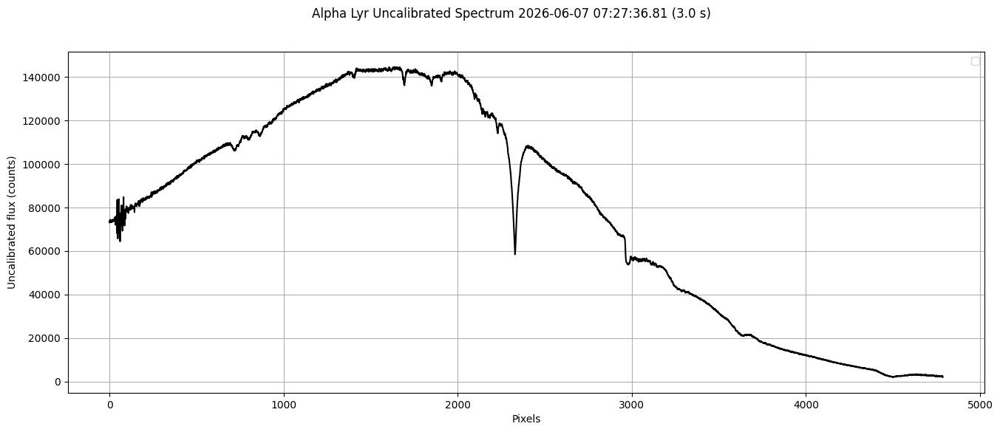

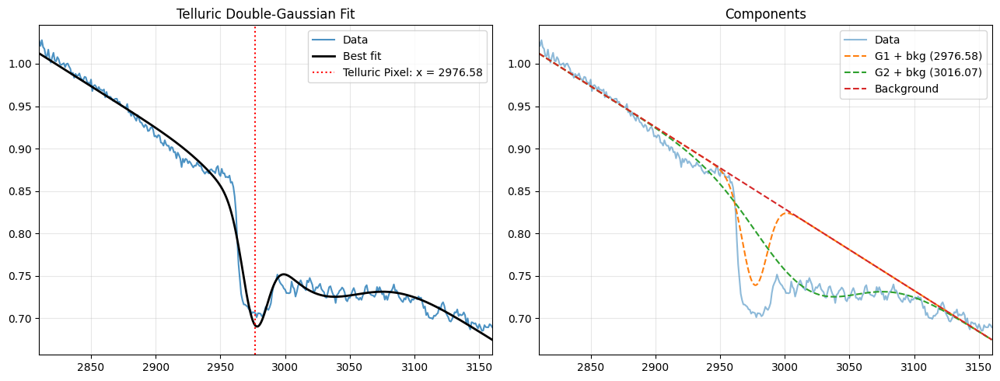

2976.5756769174914


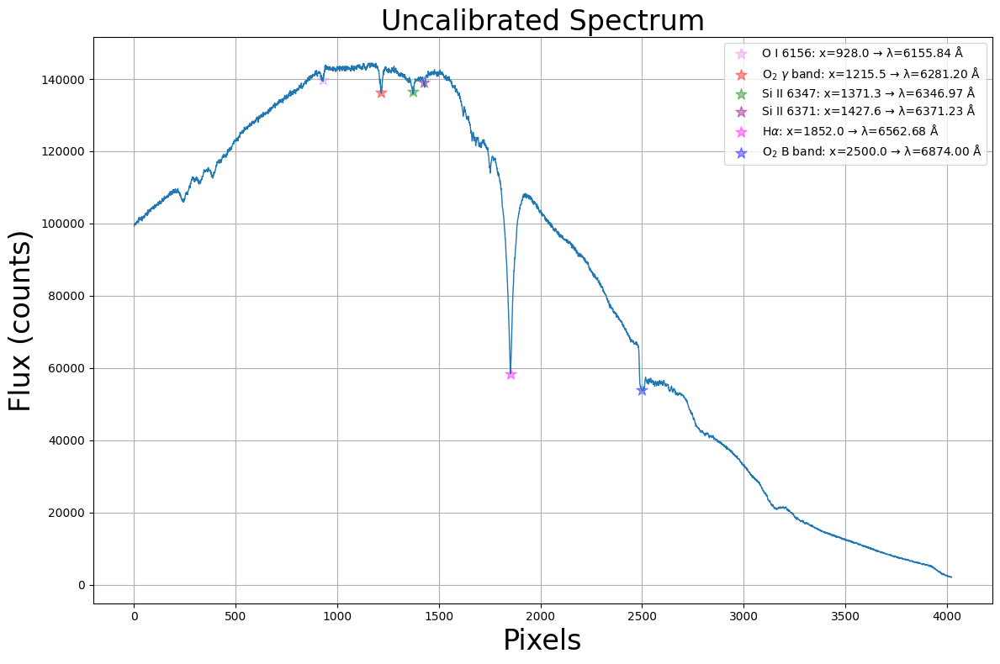

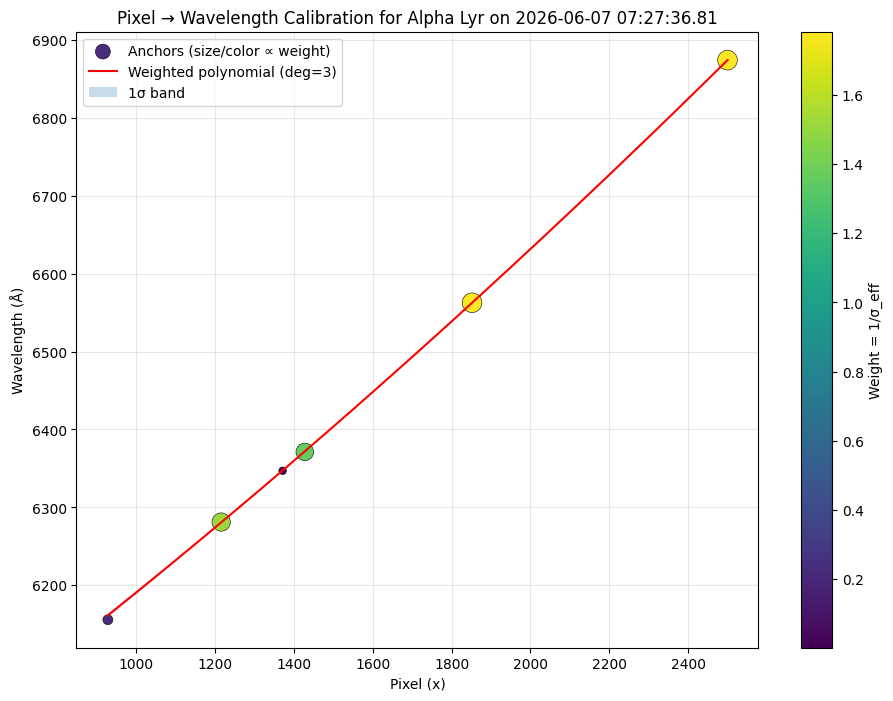

R2 Value:  0.9999000310907032


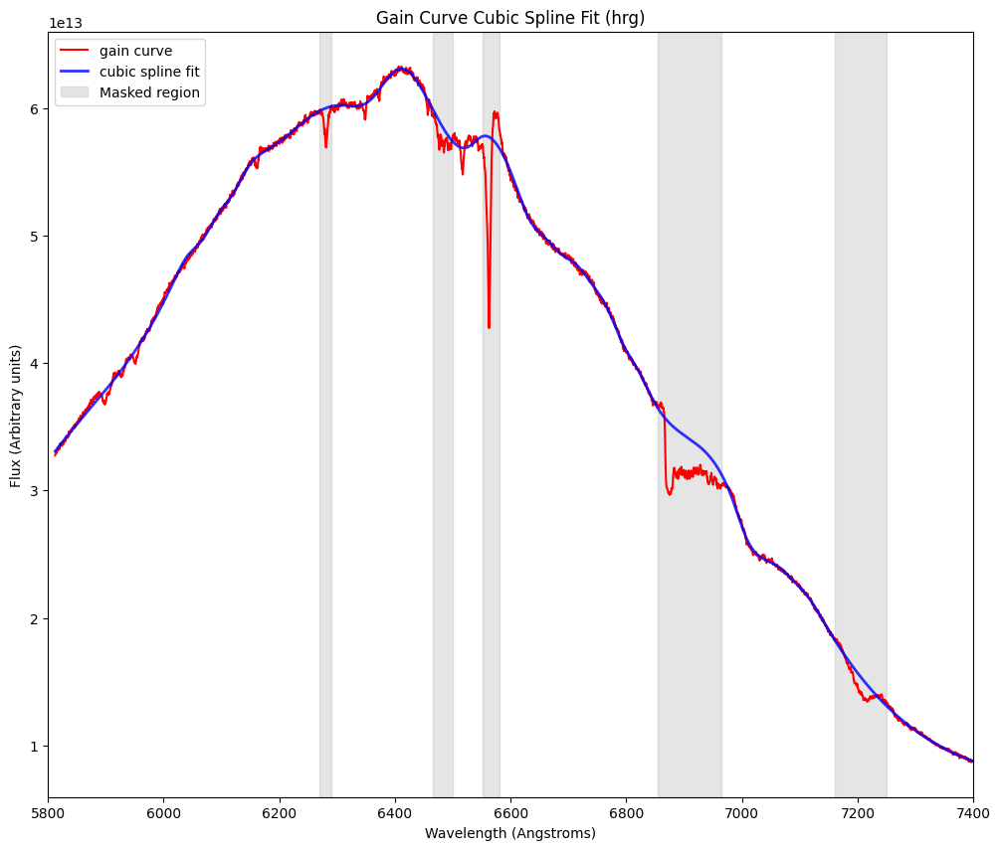

In [32]:
i = 540

S = spectrum(calib_img_files[i], calib_spectrum = None, filter = filter, calib_img = True)

print(f'Moon Angle & Phase: {S.moonangle:.2f} degrees, {(S.moonphase * 100):.2f} %')

S.remove_hot_pixels(readnoise = 3, niter = 1)
trace_center, cutouts, subim = S.fit_trace(plot = True, curved = True, show_points = True)
spec = S.extract_spectrum(extract_percent = 95, show_box = True, plot = True, curved_box = True, curve_power = 1.5)
telluric_pixel = S.fit_telluric(plot = True, debugging = False)
print(telluric_pixel)
wavelength_correction = S.derive_wavelength_correction()
wave_calib = S.derive_wavelength_solution(show_points = True, plot = True)
print('R2 Value: ', S.wave_r2)
waves = S.wavelength_calibrate()
ref_wave, ref_flux = S.load_ref_spectrum('STELIB')
wave_grid, flux_data_interp, flux_ref_interp = S.match_and_interpolate()
gain_curve = S.derive_gain_calibration(plot = True)

# for key, value in vars(S).items():
#     print(f"{key}: {type(value)}")

In [ ]:
QHY_calib_spectra = []

i = 0
for grism_image in calib_img_files:
    S = spectrum(grism_image, calib_spectrum = None, filter = filter, calib_img = True)
    print('')
    print(f'Processing Calib Spectrum {i+1} of {len(calib_img_files)}: {S.object_name} ({S.obs_date}, {S.exp_time})')
    print('')

    i += 1

    if S.camera == 'ASI Camer':
        print('Skipping ZWO calibration image')
        continue

    # print(f'Moon Separation & Phase: {S.moonangle:.2f} degrees, {(S.moonphase * 100):.2f} %')
    try:
        trace_center, cutouts, subim = S.fit_trace(plot = False, curved = True)
        spec = S.extract_spectrum(extract_percent = 95, show_box = False, plot = False, curved_box = True, curve_power = 1.5)
        telluric_pixel = S.fit_telluric(plot = False)
        wavelength_correction = S.derive_wavelength_correction()
        wave_calib = S.derive_wavelength_solution(show_points = False, plot = False)
        if S.wave_r2 < 0.9999:
            print(f"Warning: Low R2 value ({S.wave_r2:.8f}) for wavelength solution in {grism_image}")
            if S.wave_r2 < 0.999:
                raise ValueError(f"Low R2 value ({S.wave_r2:.8f}) for wavelength solution in {grism_image}")
        waves = S.wavelength_calibrate()
        ref_wave, ref_flux = S.load_stelib_spectrum('STELIB')
        wave_grid, flux_data_interp, flux_ref_interp = S.match_and_interpolate()
        gain_curve = S.derive_gain_calibration(plot = False)
        QHY_calib_spectra.append(S)
    except Exception as e:
        print(f"Error occurred while processing: {e}")
        S.flagged = True
        QHY_calib_spectra.append(S)
        continue


Processing Calib Spectrum 1 of 769: hr 3454 (2025-12-05 12:27:51.32, 15.0)

Skipping ZWO calibration image

Processing Calib Spectrum 2 of 769: hr 3454 (2025-12-05 12:28:10.69, 15.0)

Skipping ZWO calibration image

Processing Calib Spectrum 3 of 769: hr 3454 (2025-12-05 12:28:30.20, 30.0)

Skipping ZWO calibration image

Processing Calib Spectrum 4 of 769: hr 3454 (2025-12-05 12:29:04.57, 30.0)

Skipping ZWO calibration image

Processing Calib Spectrum 5 of 769: hr 3454 (2025-12-05 12:29:39.14, 60.0)

Skipping ZWO calibration image

Processing Calib Spectrum 6 of 769: hr 3454 (2025-12-05 12:30:43.57, 60.0)

Skipping ZWO calibration image

Processing Calib Spectrum 7 of 769: hr 4468 (2025-12-05 12:33:00.33, 15.0)

Skipping ZWO calibration image

Processing Calib Spectrum 8 of 769: hr 4468 (2025-12-05 12:33:19.76, 15.0)

Skipping ZWO calibration image

Processing Calib Spectrum 9 of 769: hr 4468 (2025-12-05 12:33:39.21, 30.0)

Skipping ZWO calibration image

Processing Calib Spectrum 1

## Export to pkl file

In [11]:
import pickle

def save_selected_attributes(objects, filename, include_attrs=None, skip_flagged=False):
    """
    Save only selected attributes from a list of class objects.

    Parameters
    ----------
    objects : list
        List of class instances.
    filename : str
        Output pickle filename.
    include_attrs : list of str or None
        Attributes to save. If None, uses a compact calibration-focused default.
    skip_flagged : bool
        If True, skip objects with flagged=True.
    """

    if include_attrs is None:
        include_attrs = [
            "object_name",
            "obs_date",
            "filter",
            "camera",
            "grism_image",
            "flagged",
            "hdr",
            "imsize_x",
            "imsize_y",
            "airmass",
            "exp_time",
            "moonangle",
            "moonphase",
            "trace_model",
            "telluric_pixel",
            "wavelength_range",
            "wavelength_correction",
            "wave_calib",
            "wave_r2",
            "wave_centroids",
            "pix_centroids",
            "gain_smooth",
            "wave_grid",
            "mean_fwhm",
            "median_fwhm",
            "std_fwhm"
        ]

    payload = []

    for obj in objects:
        if skip_flagged and getattr(obj, "flagged", False):
            continue

        row = {}

        for attr in include_attrs:
            val = getattr(obj, attr, None)

            try:
                # ensure it is pickleable
                pickle.dumps(val, protocol=pickle.HIGHEST_PROTOCOL)
                row[attr] = val
            except Exception:
                row[attr] = repr(val)

        payload.append(row)

    with open(filename, "wb") as f:
        pickle.dump(payload, f, protocol=pickle.HIGHEST_PROTOCOL)

    print(f"Saved {len(payload)} objects to {filename}")

def restore_spectrum_objects_from_pickle(pkl_file, spectrum_class):
    """
    Restore lightweight spectrum-like objects from a pickle file
    containing a list of dictionaries.

    Parameters
    ----------
    pkl_file : str
        Path to pickle file.
    spectrum_class : class
        Your spectrum class from grism_utils_v2.py

    Returns
    -------
    objects : list
        List of restored spectrum_class instances.
    """
    with open(pkl_file, "rb") as f:
        data = pickle.load(f)

    objects = []

    for row in data:
        obj = spectrum_class.__new__(spectrum_class)  # bypass __init__

        for key, val in row.items():
            setattr(obj, key, val)
            
        objects.append(obj)

    return objects

def estimate_object_list_size(obj_list, verbose=True):
    """
    Estimate total size of a list of class objects by summing attribute sizes.

    Parameters
    ----------
    obj_list : list
        List of class objects (e.g. spectrum objects)
    verbose : bool
        If True, print per-attribute totals

    Returns
    -------
    total_mb : float
        Estimated total size in MB
    attr_sizes_mb : dict
        Dictionary of total size per attribute across all objects
    """

    attr_sizes = {}

    for obj in obj_list:
        for key, val in vars(obj).items():
            try:
                size = sys.getsizeof(val)

                # Better estimate for numpy arrays
                if isinstance(val, np.ndarray):
                    size = val.nbytes

                attr_sizes[key] = attr_sizes.get(key, 0) + size

            except Exception:
                continue

    attr_sizes_mb = {
        key: val / (1024**2)
        for key, val in attr_sizes.items()
    }

    total_mb = sum(attr_sizes_mb.values())

    if verbose:
        print(f"\nTotal estimated size: {total_mb:.2f} MB\n")

        for key, size_mb in sorted(
            attr_sizes_mb.items(),
            key=lambda x: x[1],
            reverse=True
        ):
            print(f"{key:30s} {size_mb:10.3f} MB")

    return total_mb, attr_sizes_mb

In [20]:
restored_calib_spectra = restore_spectrum_objects_from_pickle(
    "Calib_Spectra_hrg_QHY.pkl",
    spectrum
)

In [21]:
trace_models = [S.trace_model for S in restored_calib_spectra]
c0_avg = np.mean([model.c0.value for model in trace_models if model is not None])
c1_avg = np.mean([model.c1.value for model in trace_models if model is not None])
c2_avg = np.mean([model.c2.value for model in trace_models if model is not None])
print(f"Average Trace Coefficients: c0={c0_avg:.8f}, c1={c1_avg:.8f}, c2={c2_avg:.8f}")

Average Trace Coefficients: c0=1587.36221951, c1=-0.03129693, c2=0.00000195


In [22]:
trace_models = [S.trace_model for S in restored_calib_spectra]
c0_avg = np.median([model.c0.value for model in trace_models if model is not None])
c1_avg = np.median([model.c1.value for model in trace_models if model is not None])
c2_avg = np.median([model.c2.value for model in trace_models if model is not None])
print(f"Average Trace Coefficients: c0={c0_avg:.8f}, c1={c1_avg:.8f}, c2={c2_avg:.8f}")

Average Trace Coefficients: c0=1586.31434572, c1=-0.03062304, c2=0.00000201


In [23]:
tel_pixs = [S.telluric_pixel for S in restored_calib_spectra]
np.mean(tel_pixs)

np.float64(2975.0878021325843)

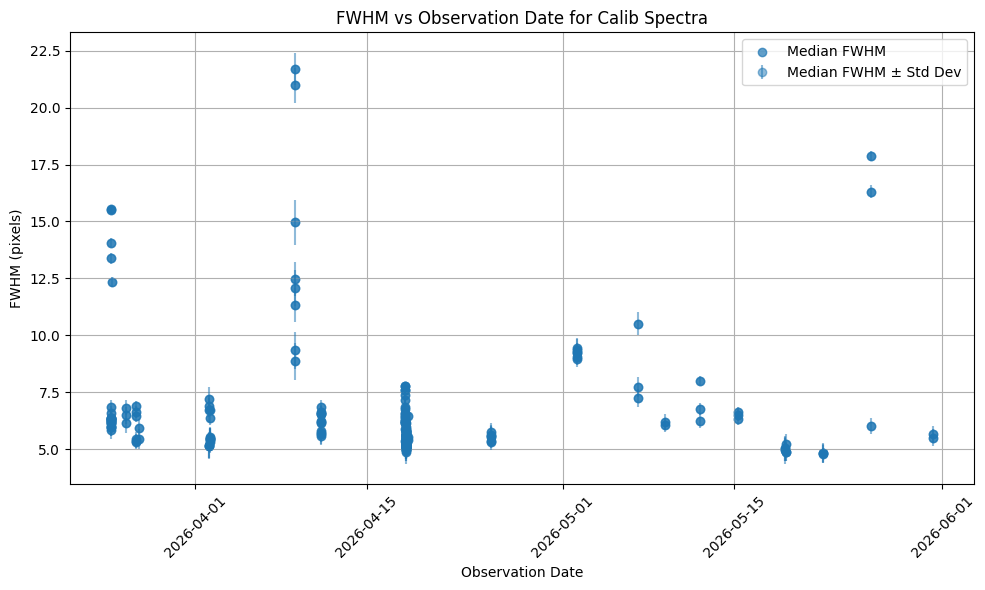

In [24]:
# Extract values
dates = [pd.to_datetime(S.obs_date) for S in restored_calib_spectra]
median_fwhms = [S.median_fwhm for S in restored_calib_spectra]
median_stds = [S.std_fwhm for S in restored_calib_spectra]
mean_fwhms = [S.mean_fwhm for S in restored_calib_spectra]

# Build dataframe so sorting is easy
df = pd.DataFrame({
    "date": dates,
    "median_fwhm": median_fwhms,
    "std_fwhm": median_stds,
    "mean_fwhm": mean_fwhms
})

# Sort by observation date
df = df.sort_values("date")

# Plot
plt.figure(figsize=(10, 6))

plt.scatter(
    df["date"],
    df["median_fwhm"],
    alpha=0.7,
    label="Median FWHM"
)

plt.errorbar(
    df["date"],
    df["median_fwhm"],
    yerr=df["std_fwhm"],
    fmt='o',
    alpha=0.5,
    label="Median FWHM ± Std Dev"
)

plt.xlabel("Observation Date")
plt.ylabel("FWHM (pixels)")
plt.title("FWHM vs Observation Date for Calib Spectra")
plt.legend()
plt.grid()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [39]:
total_mb, attr_sizes = estimate_object_list_size(
    restored_calib_spectra,
    verbose=True
)


Total estimated size: 11.98 MB

gain_smooth                         5.866 MB
wave_grid                           5.866 MB
grism_image                         0.034 MB
wave_centroids                      0.028 MB
pix_centroids                       0.028 MB
wavelength_range                    0.022 MB
wave_calib                          0.022 MB
obs_date                            0.012 MB
camera                              0.009 MB
object_name                         0.009 MB
hdr                                 0.009 MB
trace_model                         0.009 MB
filter                              0.008 MB
wave_r2                             0.006 MB
mean_fwhm                           0.006 MB
median_fwhm                         0.006 MB
std_fwhm                            0.006 MB
flagged                             0.005 MB
imsize_x                            0.005 MB
imsize_y                            0.005 MB
airmass                             0.004 MB
exp_time              

In [12]:
save_selected_attributes(QHY_calib_spectra, "Calib_Spectra_hrg_QHY.pkl")

Saved 201 objects to Calib_Spectra_hrg_QHY.pkl


## Diagnostic Calibration + Trace Plots

In [11]:
def get_telluric_pixel_stats(calib_spectra):
    telluric_pixels = []
    indices = []

    for i, S in enumerate(calib_spectra):
        if getattr(S, "flagged", False):
            continue
        if hasattr(S, "telluric_pixel"):
            val = S.telluric_pixel
            if val is not None and np.isfinite(val):
                telluric_pixels.append(val)
                indices.append(i)

    telluric_pixels = np.array(telluric_pixels, dtype=float)

    if len(telluric_pixels) == 0:
        raise ValueError("No valid telluric_pixel values found.")

    stats = {
        "N": len(telluric_pixels),
        "mean": float(np.mean(telluric_pixels)),
        "median": float(np.median(telluric_pixels)),
        "std": float(np.std(telluric_pixels)),
        "min": float(np.min(telluric_pixels)),
        "max": float(np.max(telluric_pixels)),
    }

    print("Telluric Pixel Statistics:")
    for k, v in stats.items():
        print(f"{k:>6}: {v:.3f}" if isinstance(v, float) else f"{k:>6}: {v}")

    return telluric_pixels, indices, stats

In [12]:
stats = get_telluric_pixel_stats(QHY_calib_spectra)
print('')
# stats = get_telluric_pixel_stats(QHY_calib_spectra)

Telluric Pixel Statistics:
     N: 191
  mean: 2975.165
median: 2978.308
   std: 9.729
   min: 2956.891
   max: 2992.619



In [13]:
def _get_spec_time(S):
    """
    Return observation time for a spectrum object as an astropy Time, or None.
    """
    try:
        if hasattr(S, "hdr") and ("DATE-OBS" in S.hdr):
            return Time(S.hdr["DATE-OBS"], format="isot", scale="utc")
        if hasattr(S, "obs_date"):
            return Time(str(S.obs_date).replace(" ", "T"), format="isot", scale="utc")
    except Exception:
        pass
    return None


def _group_specs_by_time(specs, tbin=None):
    """
    Group spectra by time proximity.

    Parameters
    ----------
    specs : list
        List of spectrum objects
    tbin : float or None
        Time bin in seconds. If None, each spectrum is its own group.

    Returns
    -------
    groups : list of lists
        Each element is a list of spectra belonging to one time group.
    """
    if tbin is None:
        return [[S] for S in specs]

    timed = []
    untimed = []

    for S in specs:
        t = _get_spec_time(S)
        if t is None:
            untimed.append(S)
        else:
            timed.append((t.unix, S))

    timed.sort(key=lambda x: x[0])

    groups = []
    i = 0
    while i < len(timed):
        t0, S0 = timed[i]
        group = [S0]
        i += 1

        while i < len(timed):
            ti, Si = timed[i]
            if (ti - t0) <= tbin:
                group.append(Si)
                i += 1
            else:
                break

        groups.append(group)

    # untimed spectra are kept individually
    for S in untimed:
        groups.append([S])

    return groups

In [14]:
from astropy.stats import sigma_clip
import numpy as np
import matplotlib.pyplot as plt

def plot_telluric_pixel_vs_airmass(calib_spectra, sigma=None):
    telluric_pixels = []
    airmass = []

    for S in calib_spectra:
        if getattr(S, "flagged", False):
            continue
        if hasattr(S, "telluric_pixel") and hasattr(S, "airmass"):
            val = S.telluric_pixel
            am = S.airmass
            if val is not None and np.isfinite(val) and np.isfinite(am):
                telluric_pixels.append(val)
                airmass.append(am)

    telluric_pixels = np.array(telluric_pixels, dtype=float)
    airmass = np.array(airmass, dtype=float)

    if len(telluric_pixels) == 0:
        raise ValueError("No valid telluric_pixel values found.")

    # --- sigma clipping ---
    if sigma is not None:
        clipped = sigma_clip(telluric_pixels, sigma=sigma)
        mask = ~clipped.mask

        telluric_pixels_clipped = telluric_pixels[mask]
        airmass_clipped = airmass[mask]

        print(f"Sigma clipping applied (σ={sigma})")
        print(f"Kept {len(telluric_pixels_clipped)} / {len(telluric_pixels)} points")

    else:
        telluric_pixels_clipped = telluric_pixels
        airmass_clipped = airmass

    # --- plotting ---
    plt.figure(figsize=(8, 5))

    # plot all points (faded)
    if sigma is not None:
        plt.scatter(airmass, telluric_pixels, alpha=0.3, label='All points')

    # plot clipped points
    plt.scatter(airmass_clipped, telluric_pixels_clipped, label='Used points')

    # --- linear fit on clipped data ---
    if len(airmass_clipped) >= 2:
        p = np.polyfit(airmass_clipped, telluric_pixels_clipped, 1)
        xfit = np.linspace(np.min(airmass_clipped), np.max(airmass_clipped), 100)
        yfit = np.polyval(p, xfit)
        plt.plot(xfit, yfit, linestyle='--', label='Linear fit')

        print(f"Slope = {p[0]:.4f} pix / airmass")
        print(f"Intercept = {p[1]:.2f} pix")

    plt.xlabel("Airmass")
    plt.ylabel("Telluric Pixel")
    plt.title("Telluric Pixel vs Airmass")
    plt.grid(alpha=0.3)
    plt.legend()

    plt.tight_layout()
    plt.show()

    return airmass_clipped, telluric_pixels_clipped

Sigma clipping applied (σ=2)
Kept 186 / 191 points
Slope = 31.4932 pix / airmass
Intercept = 2932.90 pix


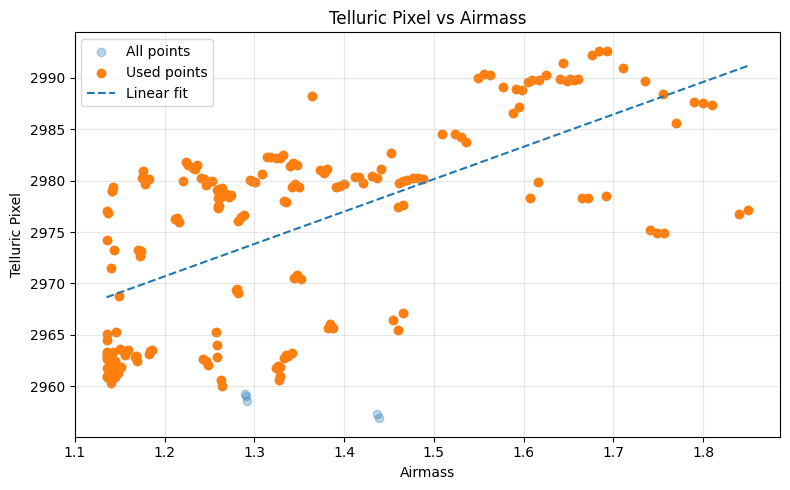

In [15]:
a = plot_telluric_pixel_vs_airmass(QHY_calib_spectra, sigma = 2)
# a = plot_telluric_pixel_vs_airmass(QHY_calib_spectra, sigma = 3)

In [16]:
from astropy.stats import sigma_clip

def get_robust_telluric_pixel(calib_spectra, sigma=3):
    telluric_pixels, _, _ = get_telluric_pixel_stats(calib_spectra)

    clipped = sigma_clip(telluric_pixels, sigma=sigma)
    good = clipped.data[~clipped.mask]

    robust_val = float(np.median(good))
    robust_std = float(np.std(good))

    print(f"Robust Telluric Pixel (sigma={sigma}):")
    print(f"Median = {robust_val:.3f}")
    print(f"Std    = {robust_std:.3f}")
    print(f"N used = {len(good)} / {len(telluric_pixels)}")

    return robust_val, robust_std, good

In [17]:
a = get_robust_telluric_pixel(QHY_calib_spectra, sigma=2)
# a = get_robust_telluric_pixel(QHY_calib_spectra, sigma=3)

Telluric Pixel Statistics:
     N: 191
  mean: 2975.165
median: 2978.308
   std: 9.729
   min: 2956.891
   max: 2992.619
Robust Telluric Pixel (sigma=2):
Median = 2978.388
Std    = 9.447
N used = 186 / 191


In [18]:
def plot_trace_geometry_diagnostics(calib_spectra):
    good_specs = [S for S in calib_spectra if not getattr(S, "flagged", False)]

    idx = []
    xcent = []
    ycent = []
    angle = []
    curvature = []
    telluric_x = []
    telluric_y = []

    for i, S in enumerate(good_specs):
        try:
            geom = S.trace_geometry()
            idx.append(i)
            xcent.append(geom["x"])
            ycent.append(geom["y"])
            angle.append(geom["angle_deg"])
            curvature.append(geom["curvature"])

            if hasattr(S, "telluric_pixel") and S.telluric_pixel is not None and np.isfinite(S.telluric_pixel):
                telluric_x.append(S.telluric_pixel)
                telluric_y.append(S.trace_model(S.telluric_pixel))
            else:
                telluric_x.append(np.nan)
                telluric_y.append(np.nan)

        except Exception:
            continue

    idx = np.array(idx)
    xcent = np.array(xcent)
    ycent = np.array(ycent)
    angle = np.array(angle)
    curvature = np.array(curvature)
    telluric_x = np.array(telluric_x)
    telluric_y = np.array(telluric_y)

    fig, axes = plt.subplots(6, 1, figsize=(12, 17), sharex=True)

    axes[0].plot(idx, xcent, 'o-')
    axes[0].set_ylabel("X center [pix]")
    axes[0].set_title("Trace Geometry vs Calibration Index")
    axes[0].grid(alpha=0.3)

    axes[1].plot(idx, ycent, 'o-')
    axes[1].set_ylabel("Flux-weighted y center [pix]")
    axes[1].grid(alpha=0.3)

    axes[2].plot(idx, angle, 'o-')
    axes[2].set_ylabel("Angle [deg]")
    axes[2].grid(alpha=0.3)

    axes[3].plot(idx, curvature, 'o-')
    axes[3].set_ylabel(r"Curvature [pix$^{-1}$]")
    axes[3].grid(alpha=0.3)

    axes[4].plot(idx, telluric_x, 'o-')
    axes[4].set_ylabel("Telluric x [pix]")
    axes[4].set_xlabel("Calibration spectrum index")
    axes[4].grid(alpha=0.3)
    # axes[4].axhline(2394, color='red', linestyle='--', alpha=0.7, label='Center (x = 2394 pix)')
    axes[4].legend()

    axes[5].plot(idx, telluric_y, 'o-')
    axes[5].set_ylabel("Telluric y [pix]")
    axes[5].set_xlabel("Calibration spectrum index")
    axes[5].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

    return fig

/var/folders/08/c5fp_7gd15q__x4p30z61wl80000gn/T/ipykernel_40890/427966911.py:63: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[4].legend()


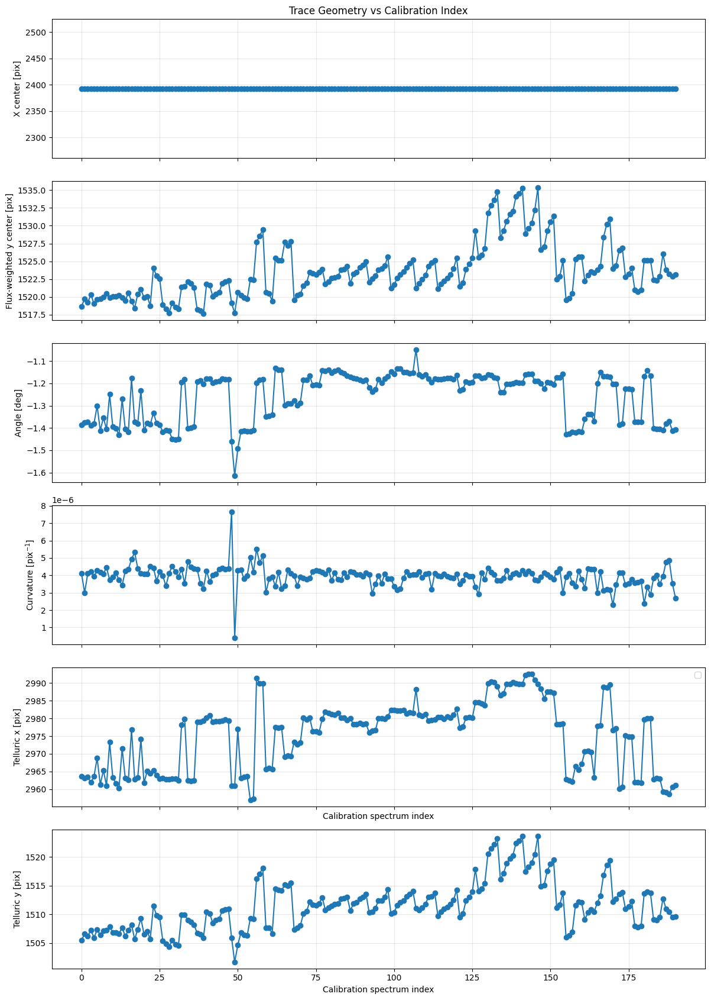

In [19]:
fig = plot_trace_geometry_diagnostics(QHY_calib_spectra)
# fig = plot_trace_geometry_diagnostics(QHY_calib_spectra)

In [20]:
from astropy.time import Time
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

def plot_median_wavelength_solution(
    calib_spectra,
    npix=None,
    coeffs=False,
    wave_range=None,
    tbin=None
):
    """
    Plot the median wavelength solution and scatter.

    Parameters
    ----------
    calib_spectra : list
        List of calibration spectrum objects.
    npix : int or None
        Number of pixels for evaluating the wavelength solution.
    coeffs : bool
        If True, print median polynomial coefficients.
    wave_range : tuple or None
        Optional wavelength range (wmin, wmax) to plot.
    tbin : float or None
        Time bin in seconds. If None, do not average in time.
        If set, spectra within tbin of each other are grouped and averaged
        before computing the final median/scatter.
    """

    good_specs = [
        S for S in calib_spectra
        if (not getattr(S, "flagged", False)) and hasattr(S, "wave_calib")
    ]

    if len(good_specs) == 0:
        raise ValueError("No valid spectra with wave_calib found.")

    if npix is None:
        npix = good_specs[0].imsize_x

    x = np.arange(npix)

    entries = []

    for S in good_specs:
        try:
            c = np.array(S.wave_calib, dtype=float)
            wave = np.polyval(c, x)

            # robust-ish observation time parsing
            if hasattr(S, "hdr") and ("DATE-OBS" in S.hdr):
                t = Time(S.hdr["DATE-OBS"], format="isot", scale="utc")
            elif hasattr(S, "obs_date"):
                t = Time(str(S.obs_date).replace(" ", "T"), format="isot", scale="utc")
            else:
                t = None

            entries.append({
                "spec": S,
                "coeff": c,
                "wave": wave,
                "time": t
            })

        except Exception:
            continue

    if len(entries) == 0:
        raise ValueError("Could not build any wavelength solutions.")

    # --------------------------------------------------
    # Optional time-bin averaging
    # --------------------------------------------------
    if tbin is not None:
        timed_entries = [e for e in entries if e["time"] is not None]
        untimed_entries = [e for e in entries if e["time"] is None]

        # sort by time
        timed_entries.sort(key=lambda e: e["time"].unix)

        grouped_waves = []
        grouped_coeffs = []

        i = 0
        while i < len(timed_entries):
            group = [timed_entries[i]]
            t0 = timed_entries[i]["time"].unix
            i += 1

            while i < len(timed_entries):
                ti = timed_entries[i]["time"].unix
                if (ti - t0) <= tbin:
                    group.append(timed_entries[i])
                    i += 1
                else:
                    break

            group_waves = np.array([g["wave"] for g in group])
            group_coeff = np.array([g["coeff"] for g in group])

            grouped_waves.append(np.nanmean(group_waves, axis=0))
            grouped_coeffs.append(np.nanmean(group_coeff, axis=0))

        # untimed entries are kept individually
        for e in untimed_entries:
            grouped_waves.append(e["wave"])
            grouped_coeffs.append(e["coeff"])

        wave_curves = np.array(grouped_waves)
        coeff_array = np.array(grouped_coeffs)

    else:
        wave_curves = np.array([e["wave"] for e in entries])
        coeff_array = np.array([e["coeff"] for e in entries])

    # --------------------------------------------------
    # Median/scatter
    # --------------------------------------------------
    wave_med = np.nanmean(wave_curves, axis=0)
    wave_std = np.nanstd(wave_curves, axis=0)

    frac_err = wave_std / np.where(np.abs(wave_med) > 1e-12, wave_med, np.nan)
    pct_err = 100 * frac_err

    # wavelength-range masking
    if wave_range is not None:
        wmin, wmax = wave_range
        mask = (wave_med >= wmin) & (wave_med <= wmax)

        x_plot = x[mask]
        wave_curves_plot = wave_curves[:, mask]
        wave_med_plot = wave_med[mask]
        wave_std_plot = wave_std[mask]
        pct_err_plot = pct_err[mask]
    else:
        x_plot = x
        wave_curves_plot = wave_curves
        wave_med_plot = wave_med
        wave_std_plot = wave_std
        pct_err_plot = pct_err

    # median coefficients
    if len(coeff_array) > 0:
        coeff_med = np.nanmedian(coeff_array, axis=0)
    else:
        coeff_med = None

    # optionally print coefficients
    if coeffs and coeff_med is not None:
        degree = len(coeff_med) - 1
        print("\nMedian Wavelength Solution Coefficients:")
        for i, val in enumerate(coeff_med):
            power = degree - i
            print(f"  a{power}: {val:.6e}")
        print("Polynomial form:")
        terms = [f"{coeff_med[i]:.3e} x^{degree-i}" for i in range(len(coeff_med))]
        print("  λ(x) = " + " + ".join(terms))

    # plotting
    fig, axes = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # TOP PANEL
    ax = axes[0]

    for wave in wave_curves_plot:
        ax.plot(x_plot, wave, alpha=0.1)

    ax.plot(x_plot, wave_med_plot, linewidth=2, label='Median wavelength')

    ax.fill_between(
        x_plot,
        wave_med_plot - wave_std_plot,
        wave_med_plot + wave_std_plot,
        alpha=0.3,
        label=r'$\pm 1\sigma$'
    )

    ax.set_ylabel("Wavelength [Å]")
    if tbin is None:
        ax.set_title("Median Wavelength Solution")
    else:
        ax.set_title(f"Median Wavelength Solution (time-averaged, tbin={tbin:g} s)")
    ax.grid(alpha=0.3)
    ax.legend()

    # BOTTOM PANEL
    ax2 = axes[1]

    ax2.plot(x_plot, wave_std_plot, label='σ (absolute)')
    ax2.set_ylabel("σ [Å]")
    ax2.grid(alpha=0.3)

    ax2b = ax2.twinx()
    ax2b.plot(x_plot, pct_err_plot, linestyle='--', label='% error')
    ax2b.set_ylabel("Percent error [%]")

    ax2.set_xlabel("Pixel")
    ax2.set_title("Wavelength Solution Scatter")

    lines = ax2.get_lines() + ax2b.get_lines()
    labels = [l.get_label() for l in lines]
    ax2.legend(lines, labels, loc='best')

    plt.tight_layout()
    plt.show()

    return fig, x_plot, wave_med_plot, wave_std_plot, pct_err_plot, coeff_med


Median Wavelength Solution Coefficients:
  a3: 3.666394e-09
  a2: 1.317165e-05
  a1: 3.741024e-01
  a0: 5.800933e+03
Polynomial form:
  λ(x) = 3.666e-09 x^3 + 1.317e-05 x^2 + 3.741e-01 x^1 + 5.801e+03 x^0


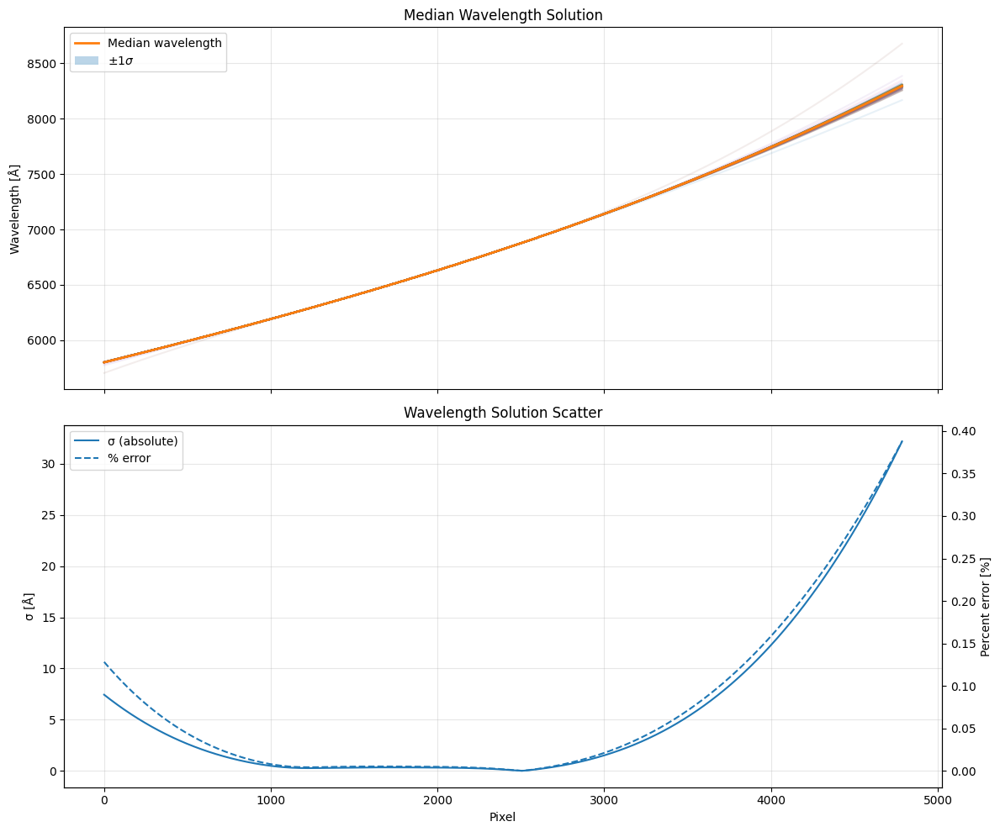


Median Wavelength Solution Coefficients:
  a3: 3.666394e-09
  a2: 1.317165e-05
  a1: 3.741024e-01
  a0: 5.800933e+03
Polynomial form:
  λ(x) = 3.666e-09 x^3 + 1.317e-05 x^2 + 3.741e-01 x^1 + 5.801e+03 x^0


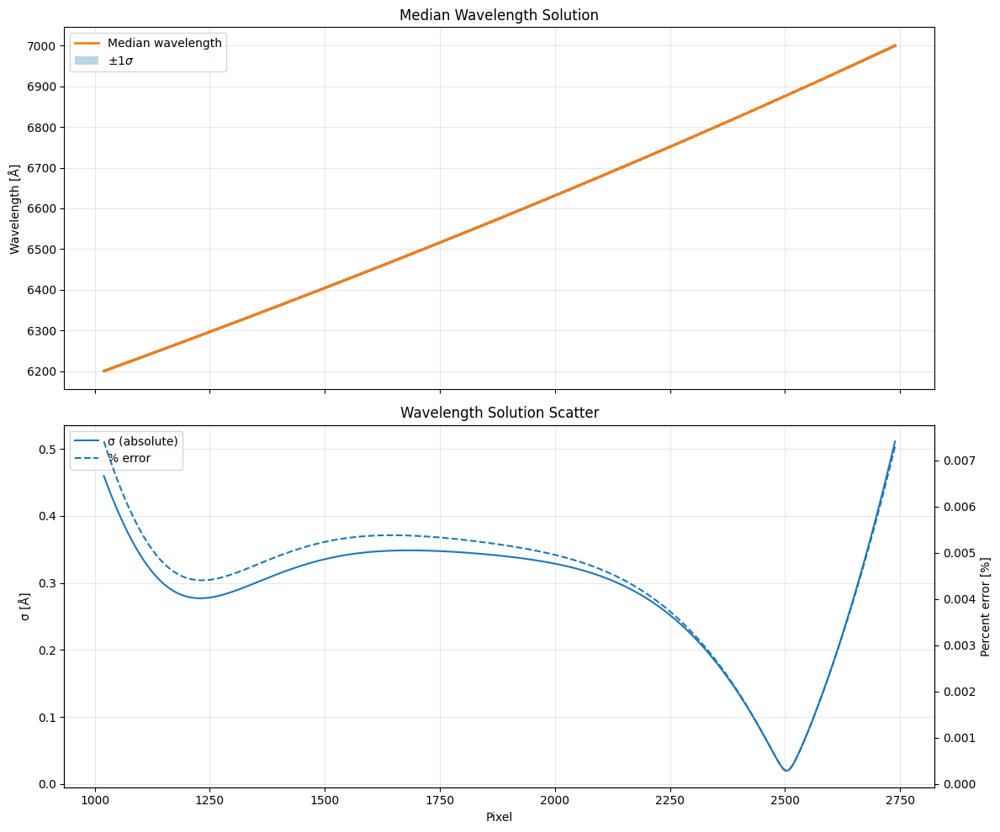


Median Wavelength Solution Coefficients:
  a3: 3.609452e-09
  a2: 1.356065e-05
  a1: 3.737741e-01
  a0: 5.801062e+03
Polynomial form:
  λ(x) = 3.609e-09 x^3 + 1.356e-05 x^2 + 3.738e-01 x^1 + 5.801e+03 x^0


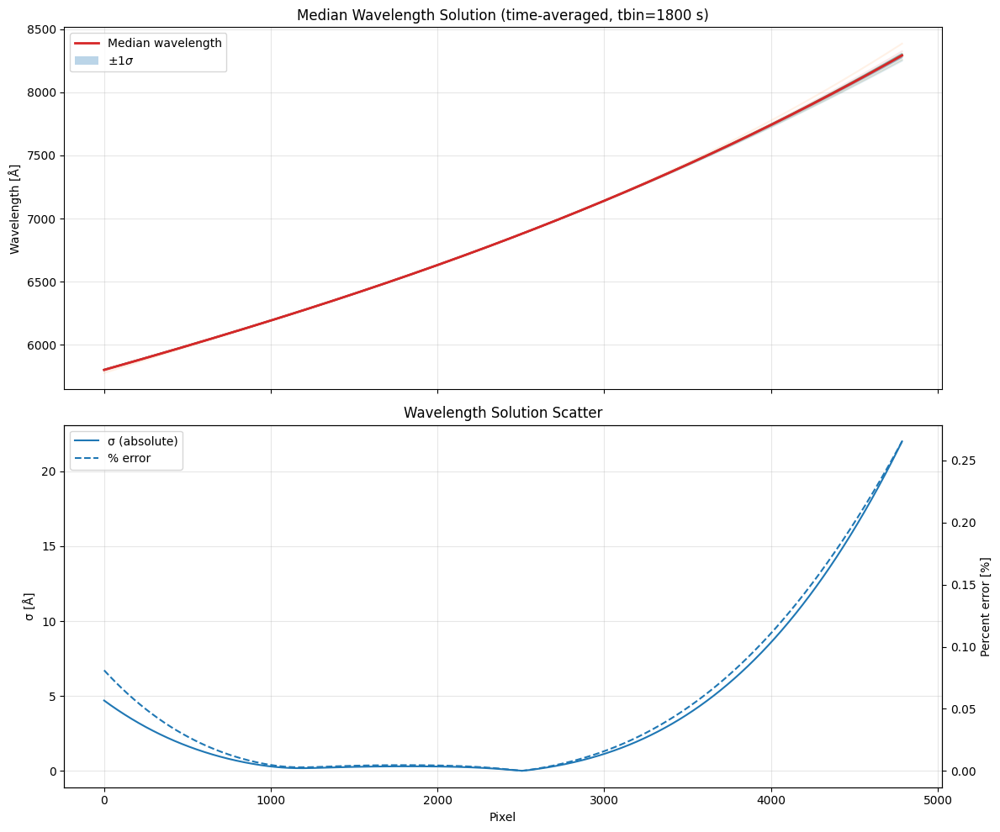


Median Wavelength Solution Coefficients:
  a3: 3.609452e-09
  a2: 1.356065e-05
  a1: 3.737741e-01
  a0: 5.801062e+03
Polynomial form:
  λ(x) = 3.609e-09 x^3 + 1.356e-05 x^2 + 3.738e-01 x^1 + 5.801e+03 x^0


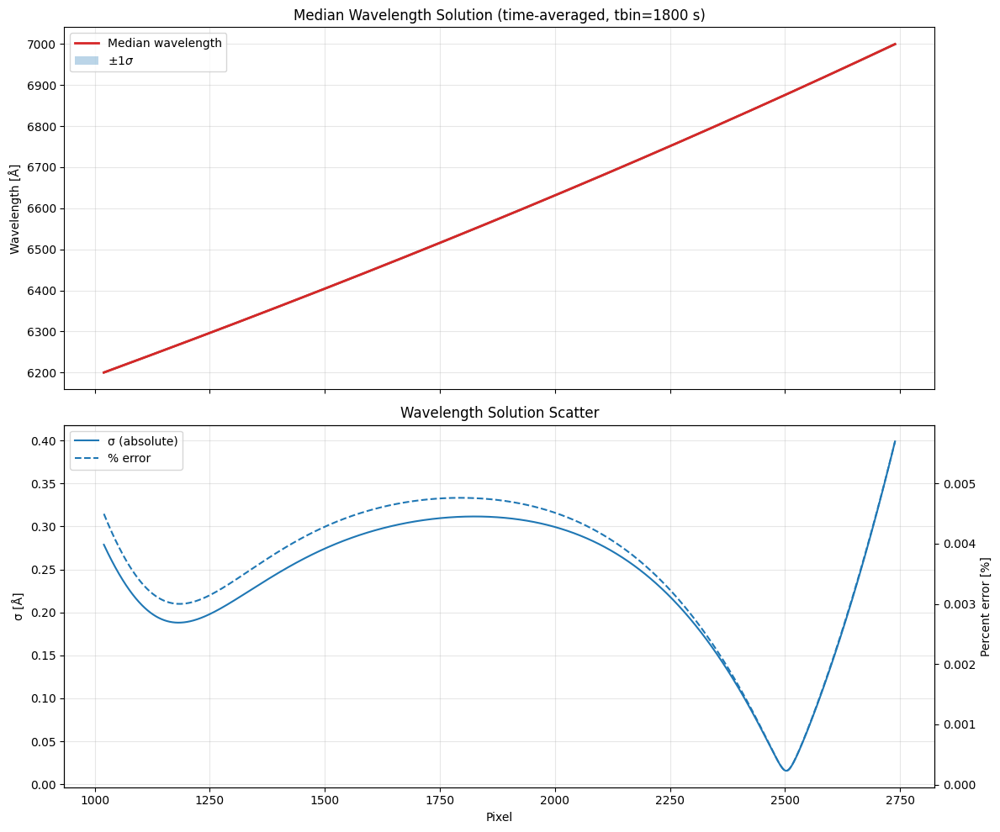

In [21]:
fig= plot_median_wavelength_solution(QHY_calib_spectra, coeffs = True)
fig= plot_median_wavelength_solution(QHY_calib_spectra, coeffs = True, wave_range = (6200, 7000))

fig= plot_median_wavelength_solution(QHY_calib_spectra, coeffs = True, tbin = 1800)
fig= plot_median_wavelength_solution(QHY_calib_spectra, coeffs = True, wave_range = (6200, 7000), tbin = 1800)

# fig= plot_median_wavelength_solution(QHY_calib_spectra, coeffs = True, wave_range = (6200, 7000))

In [22]:
def plot_median_gain_solution(calib_spectra, normalize=False, norm_region=None, tbin=None):

    good_specs = [
        S for S in calib_spectra
        if (not S.flagged)
        and hasattr(S, "gain_smooth")
        and hasattr(S, "wave_grid")
    ]

    if len(good_specs) == 0:
        raise ValueError("No valid spectra with gain_smooth and wave_grid.")

    def normalize_name(name):
        if name is None:
            return "UNKNOWN"
        name = str(name).strip().upper()
        name = " ".join(name.split())
        return name

    source_names = []
    for S in good_specs:
        if hasattr(S, "object_name"):
            source_names.append(normalize_name(S.object_name))
        else:
            source_names.append("UNKNOWN")

    unique_sources = sorted(set(source_names))
    cmap = plt.cm.Set2
    color_dict = {src: cmap(i % 20) for i, src in enumerate(unique_sources)}

    # common overlap wavelength range
    wave_mins = [np.nanmin(np.asarray(S.wave_grid, dtype=float)) for S in good_specs]
    wave_maxs = [np.nanmax(np.asarray(S.wave_grid, dtype=float)) for S in good_specs]

    wmin = max(wave_mins)
    wmax = min(wave_maxs)

    if wmin >= wmax:
        raise ValueError("No overlapping wavelength region found among gain solutions.")

    n_common = min(len(np.asarray(S.wave_grid)) for S in good_specs)
    wave_common = np.linspace(wmin, wmax, n_common)

    groups = _group_specs_by_time(good_specs, tbin=tbin)

    gain_curves = []
    curve_sources = []

    for group in groups:
        group_gains = []
        group_srcs = []

        for S in group:
            try:
                wave_i = np.asarray(S.wave_grid, dtype=float)
                gain_i = np.asarray(S.gain_smooth, dtype=float)

                valid = np.isfinite(wave_i) & np.isfinite(gain_i)
                wave_i = wave_i[valid]
                gain_i = gain_i[valid]

                if len(wave_i) < 2:
                    continue

                # enforce monotonic ordering just in case
                order = np.argsort(wave_i)
                wave_i = wave_i[order]
                gain_i = gain_i[order]

                # interpolate gain_smooth onto common wavelength grid
                gain = np.interp(wave_common, wave_i, gain_i)

                if normalize:
                    if norm_region is not None:
                        w1, w2 = norm_region
                        mask = (wave_common >= w1) & (wave_common <= w2)
                        if np.any(mask):
                            norm_val = np.nanmean(gain[mask])
                        else:
                            norm_val = np.nanmean(gain)
                    else:
                        norm_val = np.nanmean(gain)

                    if np.isfinite(norm_val) and norm_val != 0:
                        gain = gain / norm_val

                group_gains.append(gain)
                group_srcs.append(normalize_name(getattr(S, "object_name", "UNKNOWN")))

            except Exception as e:
                # print(f"Error occurred while processing spectrum: {e}")
                continue

        if len(group_gains) == 0:
            continue

        gain_avg = np.nanmean(np.array(group_gains), axis=0)
        gain_curves.append(gain_avg)

        unique_group_srcs = sorted(set(group_srcs))
        if len(unique_group_srcs) == 1:
            curve_sources.append(unique_group_srcs[0])
        else:
            curve_sources.append("MIXED")

    gain_curves = np.array(gain_curves)

    if gain_curves.size == 0:
        raise ValueError("No gain curves could be built after interpolation.")

    gain_med = np.nanmean(gain_curves, axis=0)
    gain_std = np.nanstd(gain_curves, axis=0)
    pct_err = 100 * gain_std / np.where(np.abs(gain_med) > 1e-8, np.abs(gain_med), np.nan)

    fig, axes = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    ax = axes[0]
    plotted_labels = set()

    for g, src in zip(gain_curves, curve_sources):
        color = color_dict[src] if src in color_dict else "black"

        if src not in plotted_labels:
            ax.plot(wave_common, g, color=color, alpha=0.4, label=src)
            plotted_labels.add(src)
        else:
            ax.plot(wave_common, g, color=color, alpha=0.4)

    ax.plot(wave_common, gain_med, linewidth=2, color='black', label='Median')
    ax.fill_between(
        wave_common,
        gain_med - gain_std,
        gain_med + gain_std,
        color='gray',
        alpha=0.3,
        label=r'$\pm 1\sigma$'
    )

    if normalize:
        ax.set_ylabel("Normalized Gain")
        title = "Normalized Median Gain Solution (Colored by Source)"
        if tbin is not None:
            title += f" [tbin={tbin:g} s]"
        ax.set_title(title)
        ax.axhline(1.0, linestyle='--', alpha=0.5)
    else:
        title = "Median Gain Solution (Colored by Source)"
        if tbin is not None:
            title += f" [tbin={tbin:g} s]"
        ax.set_title(title)
        ax.set_ylabel("Gain correction")

    ax.grid(alpha=0.3)
    ax.legend(loc='best', fontsize=8)

    ax2 = axes[1]
    ax2.plot(wave_common, gain_std, label='σ (absolute)')
    ax2.set_ylabel("σ")
    ax2.grid(alpha=0.3)

    ax2b = ax2.twinx()
    ax2b.plot(wave_common, pct_err, linestyle='--', label='% error')
    if np.any(np.isfinite(pct_err)):
        ax2b.set_ylim(0, 7 * np.nanmedian(pct_err[np.isfinite(pct_err)]))
    ax2b.set_ylabel("Percent error [%]")

    ax2.set_xlabel("Wavelength [Å]")
    ax2.set_title("Gain Solution Scatter")

    lines = ax2.get_lines() + ax2b.get_lines()
    labels = [l.get_label() for l in lines]
    ax2.legend(lines, labels, loc='best')

    plt.tight_layout()
    plt.show()

    return fig, wave_common, gain_med, gain_std, pct_err

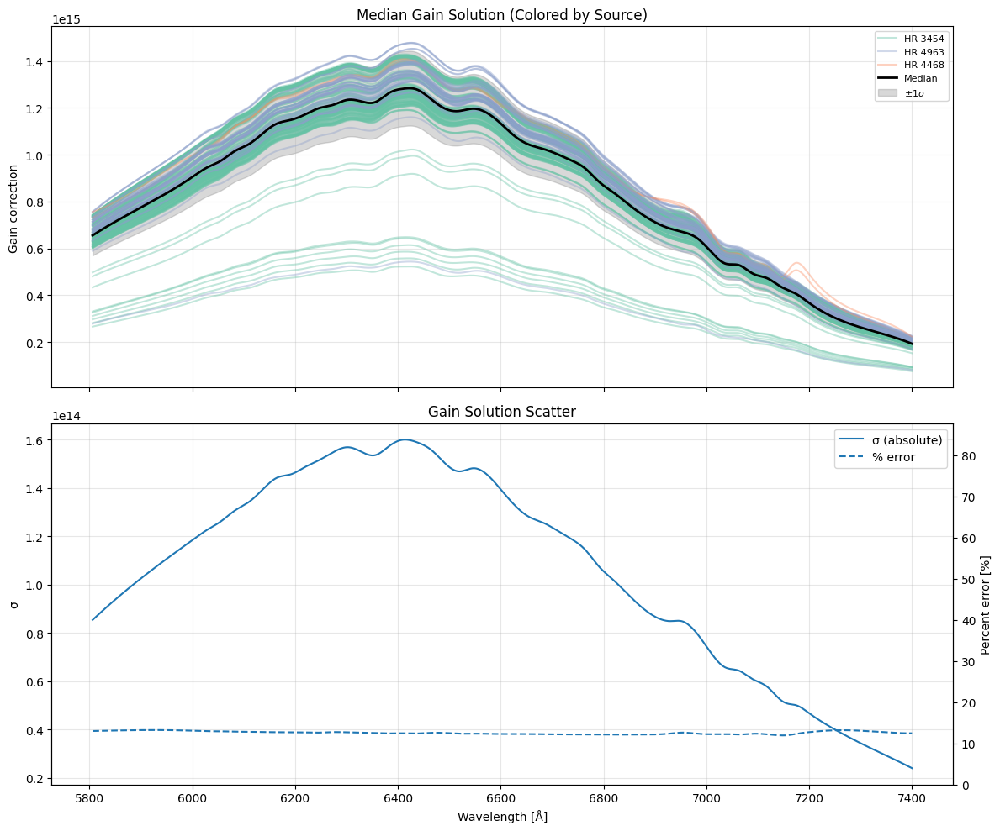

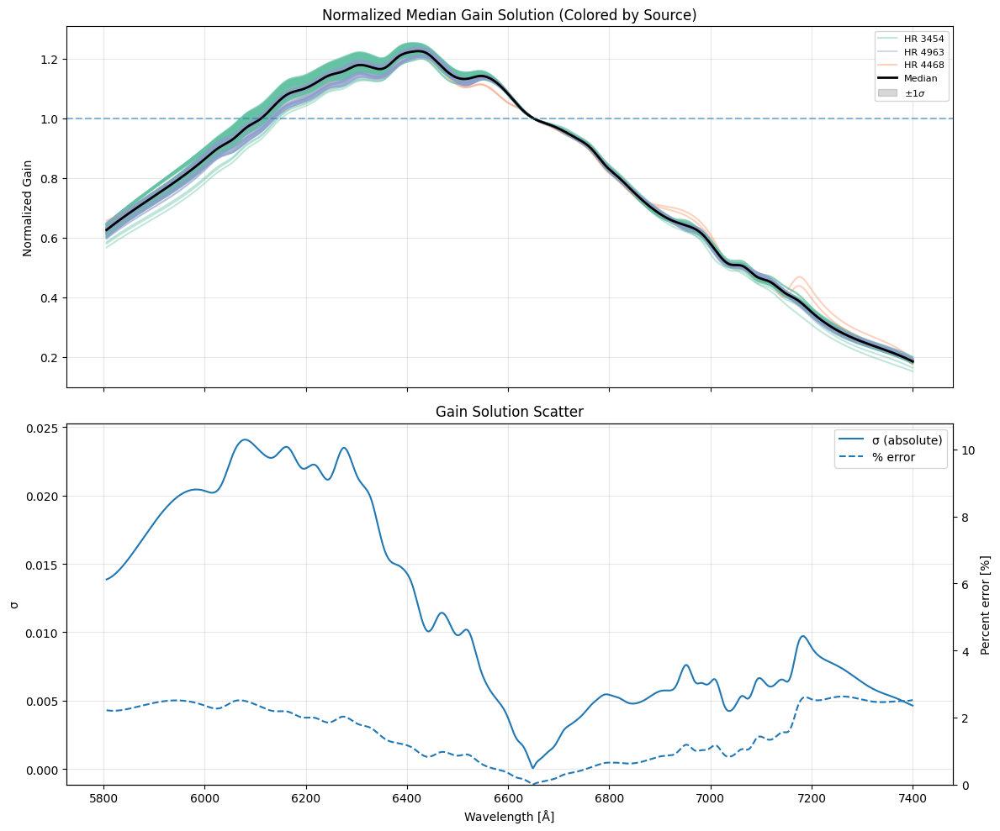

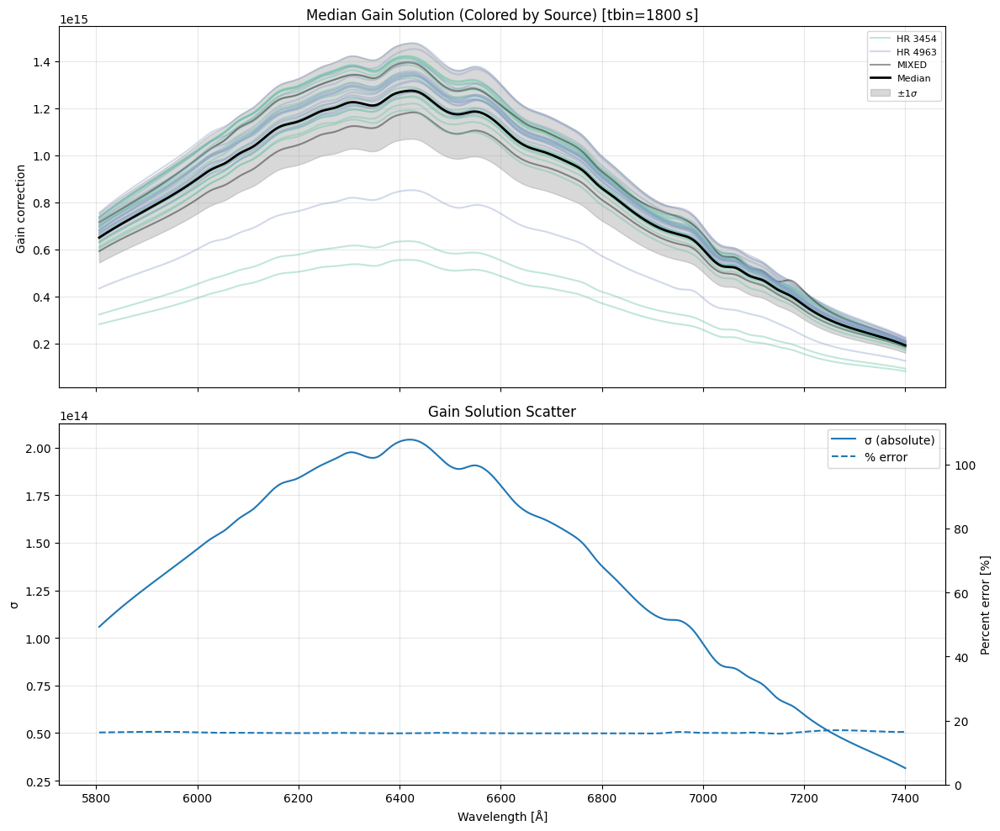

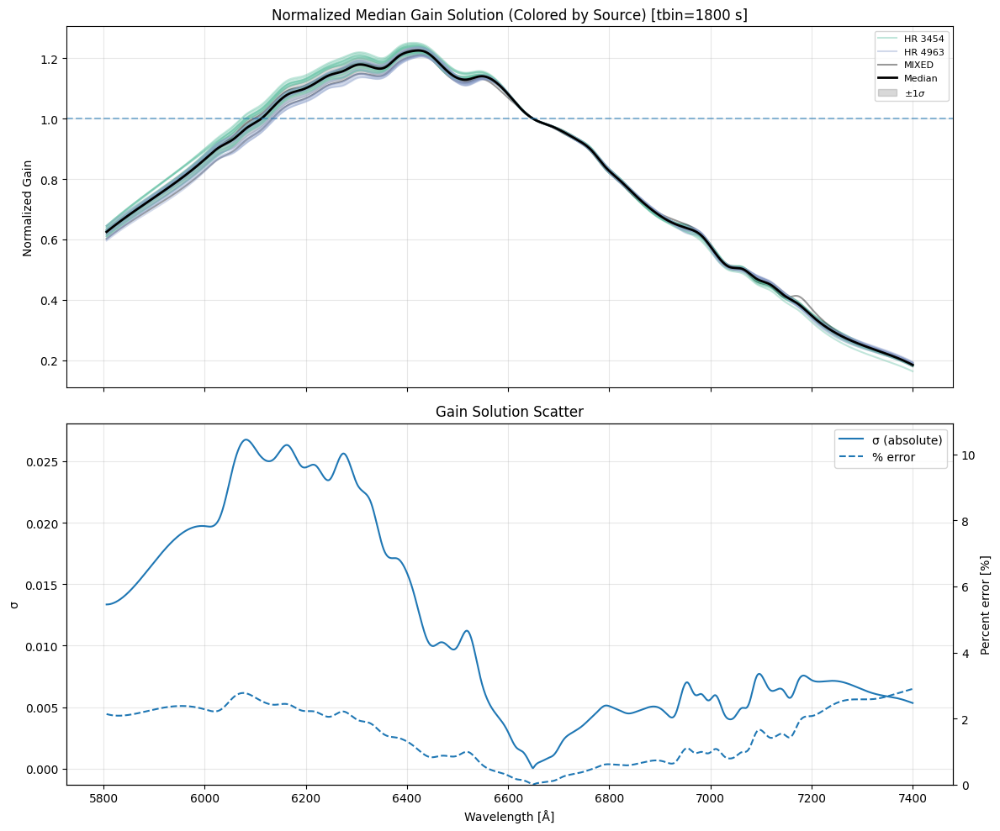

In [23]:
fig = plot_median_gain_solution(QHY_calib_spectra)
fig = plot_median_gain_solution(QHY_calib_spectra, normalize = True, norm_region = (6640, 6660))

fig = plot_median_gain_solution(QHY_calib_spectra, tbin = 1800)
fig = plot_median_gain_solution(QHY_calib_spectra, normalize = True, norm_region = (6640, 6660), tbin = 1800)
# fig = plot_median_gain_solution(QHY_calib_spectra)

In [24]:
def plot_gain_curves_vs_airmass(calib_spectra, normalize=False, norm_region=None, tbin=None):
    good_specs = [
        S for S in calib_spectra
        if (not getattr(S, "flagged", False))
        and hasattr(S, "gain_smooth")
        and hasattr(S, "wave_grid")
        and hasattr(S, "airmass")
        and (S.airmass is not None)
    ]

    if len(good_specs) == 0:
        raise ValueError("No valid spectra with gain_smooth, wave_grid, and airmass found.")

    wave_mins = [np.nanmin(np.asarray(S.wave_grid, dtype=float)) for S in good_specs]
    wave_maxs = [np.nanmax(np.asarray(S.wave_grid, dtype=float)) for S in good_specs]
    wmin = max(wave_mins)
    wmax = min(wave_maxs)

    if wmin >= wmax:
        raise ValueError("No overlapping wavelength range among gain curves.")

    n_common = min(len(np.asarray(S.wave_grid)) for S in good_specs)
    wave_common = np.linspace(wmin, wmax, n_common)

    groups = _group_specs_by_time(good_specs, tbin=tbin)

    grouped_gains = []
    grouped_airmasses = []

    for group in groups:
        gains = []
        airmasses = []

        for S in group:
            try:
                wave_i = np.asarray(S.wave_grid, dtype=float)
                gain_i = np.asarray(S.gain_smooth, dtype=float)

                valid = np.isfinite(wave_i) & np.isfinite(gain_i)
                wave_i = wave_i[valid]
                gain_i = gain_i[valid]

                if len(wave_i) < 2:
                    continue

                order = np.argsort(wave_i)
                wave_i = wave_i[order]
                gain_i = gain_i[order]

                gain = np.interp(wave_common, wave_i, gain_i)

                if normalize:
                    if norm_region is not None:
                        w1, w2 = norm_region
                        mask = (wave_common >= w1) & (wave_common <= w2)
                        if np.any(mask):
                            norm_val = np.nanmedian(gain[mask])
                        else:
                            norm_val = np.nanmedian(gain)
                    else:
                        norm_val = np.nanmax(gain)

                    if np.isfinite(norm_val) and norm_val != 0:
                        gain = gain / norm_val

                gains.append(gain)
                airmasses.append(float(S.airmass))

            except Exception:
                continue

        if len(gains) == 0:
            continue

        grouped_gains.append(np.nanmean(np.array(gains), axis=0))
        grouped_airmasses.append(np.nanmean(airmasses))

    grouped_gains = np.array(grouped_gains)
    grouped_airmasses = np.array(grouped_airmasses, dtype=float)

    norm = mpl.colors.Normalize(vmin=np.nanmin(grouped_airmasses), vmax=np.nanmax(grouped_airmasses))
    cmap = plt.cm.turbo

    fig, ax = plt.subplots(figsize=(12, 6))

    for gain, am in zip(grouped_gains, grouped_airmasses):
        ax.plot(wave_common, gain, color=cmap(norm(am)), alpha=0.8)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label("Airmass")

    ax.set_xlabel("Wavelength [Å]")

    if normalize:
        ax.set_ylabel("Normalized Gain")
        title = "Normalized Gain Curves Colored by Airmass"
        if tbin is not None:
            title += f" [tbin={tbin:g} s]"
        ax.set_title(title)
        ax.axhline(1.0, linestyle='--', alpha=0.5)
    else:
        ax.set_ylabel("Gain correction")
        title = "Gain Curves Colored by Airmass"
        if tbin is not None:
            title += f" [tbin={tbin:g} s]"
        ax.set_title(title)

    ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

    return fig, wave_common

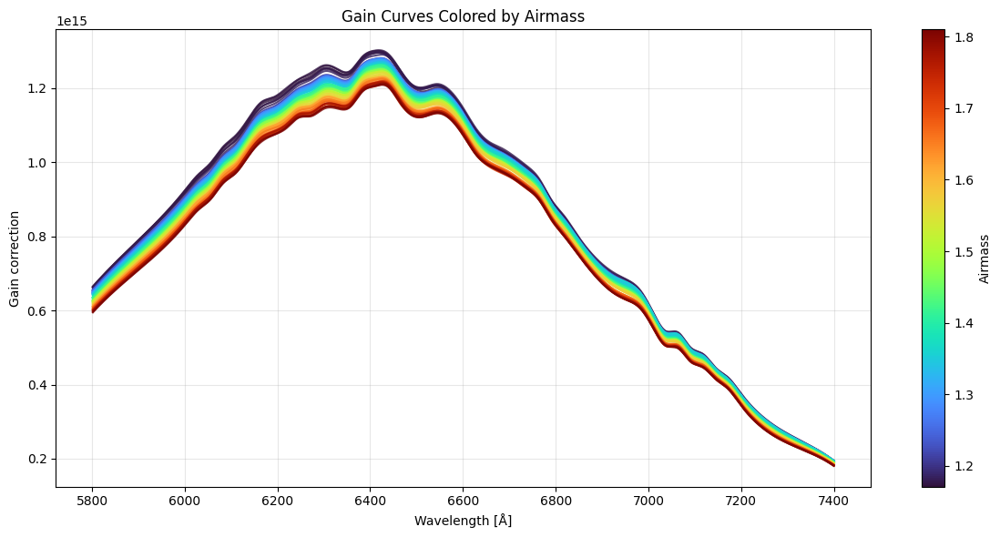

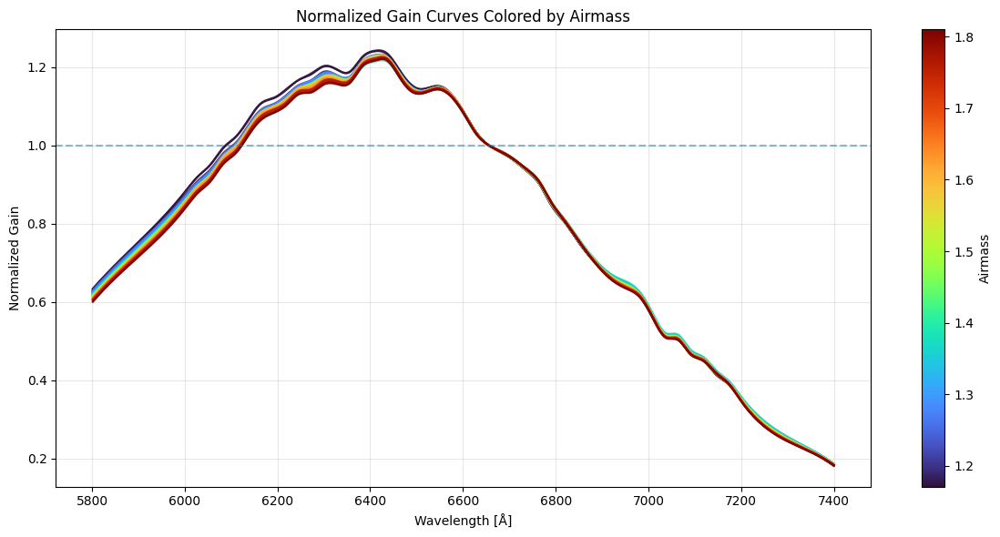

In [25]:
HR3454_2026_04_18_spectra = [S for S in QHY_calib_spectra if S.obs_date.split(' ')[0] == "2026-04-18" and S.object_name == "HR 3454"]

fig = plot_gain_curves_vs_airmass(HR3454_2026_04_18_spectra)
fig = plot_gain_curves_vs_airmass(HR3454_2026_04_18_spectra, normalize = True, norm_region = (6654, 6657))


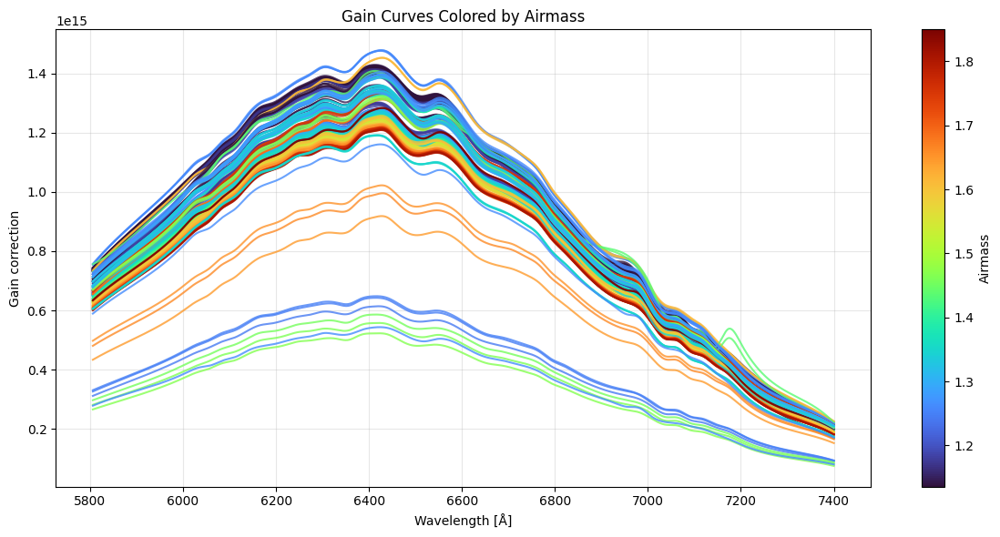

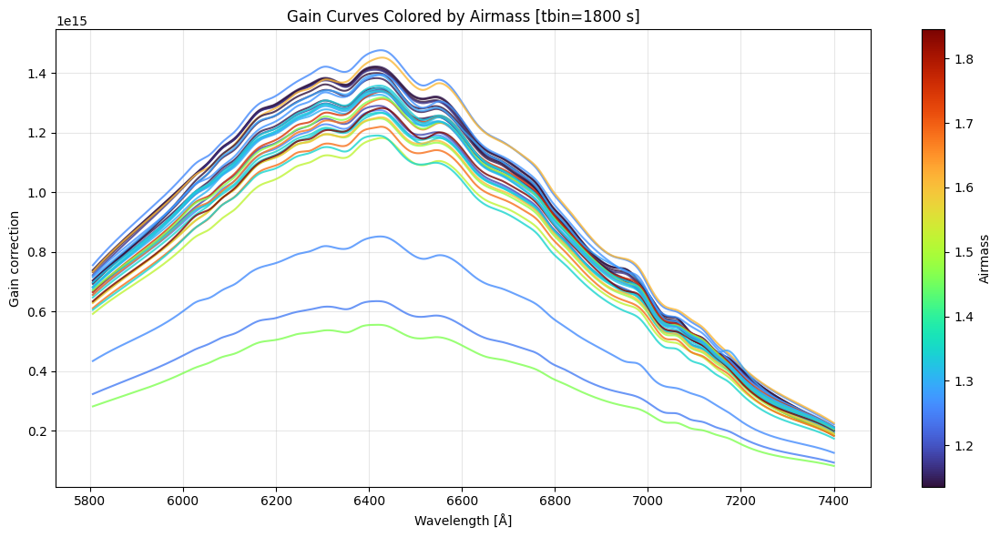

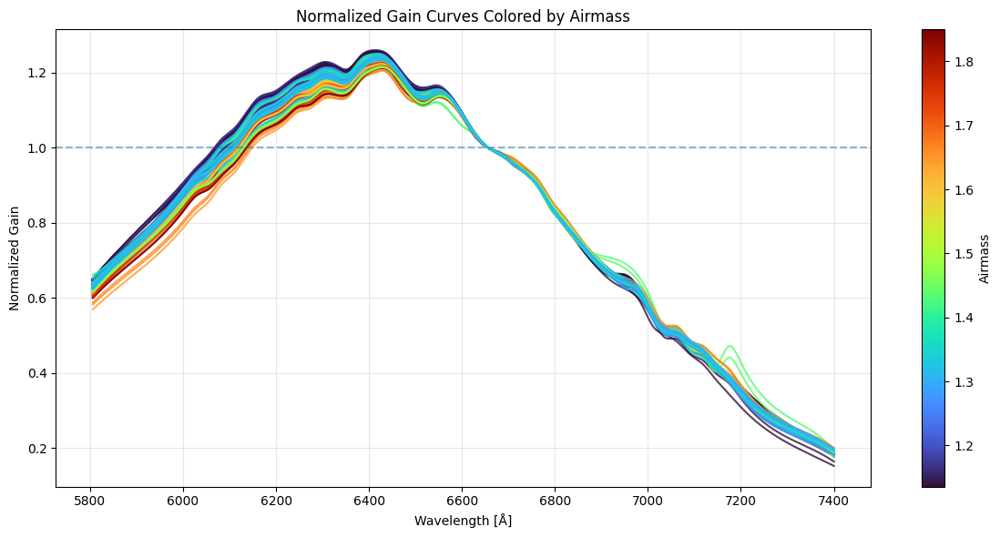

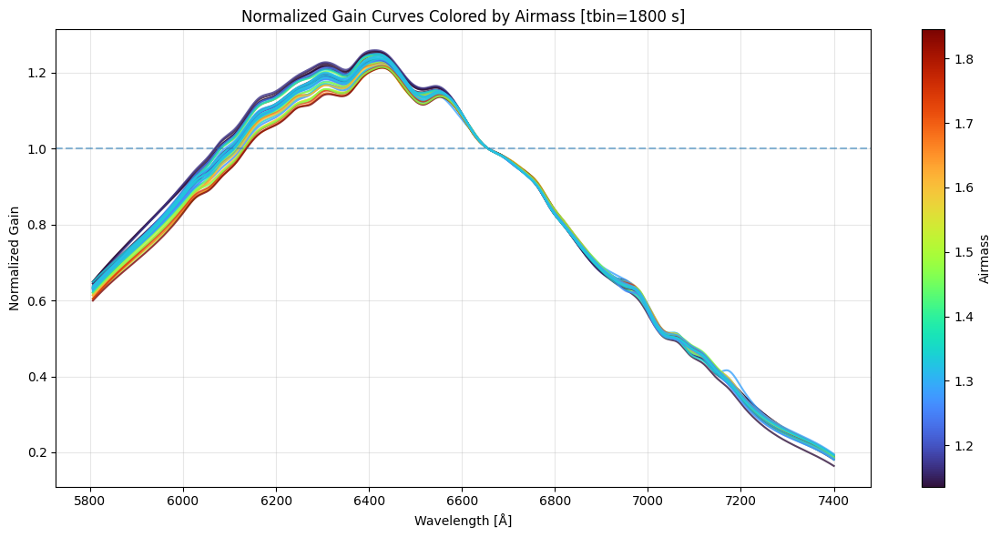

In [26]:
fig = plot_gain_curves_vs_airmass(QHY_calib_spectra, normalize = False)
fig = plot_gain_curves_vs_airmass(QHY_calib_spectra, normalize = False, tbin = 1800)

fig = plot_gain_curves_vs_airmass(QHY_calib_spectra, normalize = True, norm_region = (6654, 6657))
fig = plot_gain_curves_vs_airmass(QHY_calib_spectra, normalize = True, norm_region = (6654, 6657), tbin = 1800)


In [27]:
def derive_airmass_gain_correction(
    calib_spectra,
    fit_targets=None,
    apply_targets=None,
    normalize=True,
    norm_region=None,
    wave_range=None,
    plot_range=None,
    reference_airmass=None,
    degree=2,
    force_zero_at_norm=True,
    outlier_sigma=None,
    tbin=None,
    plot=True,
    return_corrected=True
):
    def normalize_name(name):
        if name is None:
            return "UNKNOWN"
        return " ".join(str(name).strip().upper().split())

    def build_interval_mask(wave, ranges):
        if ranges is None:
            return np.ones_like(wave, dtype=bool)

        if isinstance(ranges, tuple) and len(ranges) == 2:
            w1, w2 = ranges
            return (wave >= w1) & (wave <= w2)

        mask = np.zeros_like(wave, dtype=bool)
        for item in ranges:
            if not (isinstance(item, (tuple, list)) and len(item) == 2):
                raise ValueError("Each wave_range interval must be a 2-element tuple/list.")
            w1, w2 = item
            mask |= ((wave >= w1) & (wave <= w2))
        return mask

    def interp_gain_smooth(S, wave_common):
        wave_i = np.asarray(S.wave_grid, dtype=float)
        gain_i = np.asarray(S.gain_smooth, dtype=float)

        valid = np.isfinite(wave_i) & np.isfinite(gain_i)
        wave_i = wave_i[valid]
        gain_i = gain_i[valid]

        if len(wave_i) < 2:
            return None

        order = np.argsort(wave_i)
        wave_i = wave_i[order]
        gain_i = gain_i[order]

        return np.interp(wave_common, wave_i, gain_i)

    fit_target_set = None if fit_targets is None else set(normalize_name(t) for t in fit_targets)
    apply_target_set = None if apply_targets is None else set(normalize_name(t) for t in apply_targets)

    good_specs = [
        S for S in calib_spectra
        if (not getattr(S, "flagged", False))
        and hasattr(S, "gain_smooth")
        and hasattr(S, "wave_grid")
        and hasattr(S, "airmass")
        and (S.airmass is not None)
    ]

    if len(good_specs) == 0:
        raise ValueError("No valid spectra with gain_smooth, wave_grid, and airmass found.")

    spec_names = [normalize_name(getattr(S, "object_name", "UNKNOWN")) for S in good_specs]

    fit_specs = [
        S for S, name in zip(good_specs, spec_names)
        if (fit_target_set is None or name in fit_target_set)
    ]
    apply_specs = [
        S for S, name in zip(good_specs, spec_names)
        if (apply_target_set is None or name in apply_target_set)
    ]

    if len(fit_specs) < 2:
        raise ValueError("Need at least two valid spectra in fit_targets to derive an airmass correction.")
    if len(apply_specs) == 0:
        raise ValueError("No valid spectra found in apply_targets.")

    combined_specs = fit_specs + [S for S in apply_specs if S not in fit_specs]
    wave_mins = [np.nanmin(np.asarray(S.wave_grid, dtype=float)) for S in combined_specs]
    wave_maxs = [np.nanmax(np.asarray(S.wave_grid, dtype=float)) for S in combined_specs]

    wmin = max(wave_mins)
    wmax = min(wave_maxs)

    if wmin >= wmax:
        raise ValueError("No overlapping wavelength range among selected spectra.")

    n_common = min(len(np.asarray(S.wave_grid)) for S in combined_specs)
    wave_common = np.linspace(wmin, wmax, n_common)

    # Define normalization region only if needed
    if normalize:
        if norm_region is None:
            span = wmax - wmin
            norm_region = (wmin + 0.475 * span, wmin + 0.525 * span)

        w1, w2 = norm_region
        norm_mask = (wave_common >= w1) & (wave_common <= w2)
        if not np.any(norm_mask):
            raise ValueError("norm_region does not overlap the common wavelength grid.")

        lambda0 = float(np.nanmedian(wave_common[norm_mask]))
    else:
        norm_region = None
        norm_mask = np.ones_like(wave_common, dtype=bool)
        lambda0 = float(np.nanmedian(wave_common))

    # ----------------------------------------------------------
    # grouped fit curves
    # ----------------------------------------------------------
    fit_groups = _group_specs_by_time(fit_specs, tbin=tbin)

    provisional_fit_curves = []
    provisional_fit_airmasses = []
    provisional_fit_names = []

    for group in fit_groups:
        g_list = []
        a_list = []
        names = []

        for S in group:
            try:
                g = interp_gain_smooth(S, wave_common)
                if g is None:
                    continue

                if normalize:
                    norm_val = np.nanmedian(g[norm_mask])
                    if not np.isfinite(norm_val) or norm_val == 0:
                        continue
                    g_use = g / norm_val
                else:
                    g_use = g.copy()

                g_list.append(g_use)
                a_list.append(float(S.airmass))
                names.append(normalize_name(getattr(S, "object_name", "UNKNOWN")))
            except Exception:
                continue

        if len(g_list) == 0:
            continue

        provisional_fit_curves.append(np.nanmean(np.array(g_list), axis=0))
        provisional_fit_airmasses.append(np.nanmean(a_list))
        provisional_fit_names.append(names[0] if len(set(names)) == 1 else "MIXED")

    provisional_fit_curves = np.array(provisional_fit_curves)
    provisional_fit_airmasses = np.array(provisional_fit_airmasses, dtype=float)
    provisional_fit_names = np.array(provisional_fit_names)

    if provisional_fit_curves.shape[0] < 2:
        raise ValueError("Too few usable fit-target gain curves after provisional processing.")

    if normalize:
        provisional_rep = np.nanmedian(provisional_fit_curves, axis=0)
        target_norm_level = float(np.nanmedian(provisional_rep[norm_mask]))
    else:
        target_norm_level = None

    fit_curve_dicts = []
    for group in fit_groups:
        g_list = []
        a_list = []
        names = []
        dates = []

        for S in group:
            try:
                g = interp_gain_smooth(S, wave_common)
                if g is None:
                    continue

                if normalize:
                    curve_norm_val = np.nanmedian(g[norm_mask])
                    if not np.isfinite(curve_norm_val) or curve_norm_val == 0:
                        continue

                    scale = target_norm_level / curve_norm_val
                    g_use = g * scale
                else:
                    g_use = g.copy()

                g_list.append(g_use)
                a_list.append(float(S.airmass))
                names.append(normalize_name(getattr(S, "object_name", "UNKNOWN")))
                dates.append(getattr(S, "obs_date", None))
            except Exception:
                continue

        if len(g_list) == 0:
            continue

        fit_curve_dicts.append({
            "name": names[0] if len(set(names)) == 1 else "MIXED",
            "airmass": float(np.nanmean(a_list)),
            "curve": np.nanmean(np.array(g_list), axis=0),
            "date": dates[0] if len(set(dates)) == 1 else None
        })

    if len(fit_curve_dicts) < 2:
        raise ValueError("Too few usable fit-target gain curves after representative processing.")

    # ----------------------------------------------------------
    # Whole-curve outlier rejection
    # ----------------------------------------------------------
    rejected_curve_names = []
    rejected_curve_airmasses = []
    rejected_curve_dates = []
    curve_rms = None

    fit_curve_mask = np.ones(len(fit_curve_dicts), dtype=bool)

    if outlier_sigma is not None and len(fit_curve_dicts) >= 3:
        fit_curve_matrix = np.array([d["curve"] for d in fit_curve_dicts])
        rep_fit_curve = np.nanmedian(fit_curve_matrix, axis=0)

        metric_mask = build_interval_mask(wave_common, wave_range)
        if not np.any(metric_mask):
            raise ValueError("wave_range does not overlap the common wavelength grid.")

        residuals = fit_curve_matrix[:, metric_mask] - rep_fit_curve[metric_mask]
        curve_rms = np.sqrt(np.nanmean(residuals**2, axis=1))

        med_rms = np.nanmedian(curve_rms)
        mad_rms = np.nanmedian(np.abs(curve_rms - med_rms))
        robust_sigma = 1.4826 * mad_rms if mad_rms > 0 else np.nanstd(curve_rms)

        if np.isfinite(robust_sigma) and robust_sigma > 0:
            fit_curve_mask = np.abs(curve_rms - med_rms) <= outlier_sigma * robust_sigma

        if np.sum(fit_curve_mask) < 2:
            print("WARNING: Curve outlier rejection removed too many spectra; reverting to all curves.")
            fit_curve_mask = np.ones(len(fit_curve_dicts), dtype=bool)

    kept_fit_curve_dicts = []
    for keep, d in zip(fit_curve_mask, fit_curve_dicts):
        if keep:
            kept_fit_curve_dicts.append(d)
        else:
            rejected_curve_names.append(d["name"])
            rejected_curve_airmasses.append(d["airmass"])
            rejected_curve_dates.append(d["date"])

    if len(rejected_curve_names) > 0:
        print("\nRejected outlier gain curves:")
        for name, am, date in zip(rejected_curve_names, rejected_curve_airmasses, rejected_curve_dates):
            print(f"  {name} at airmass {am:.3f} on {date}")

    fit_matrix = np.array([d["curve"] for d in kept_fit_curve_dicts])
    fit_airmass = np.array([d["airmass"] for d in kept_fit_curve_dicts], dtype=float)
    kept_fit_names = [d["name"] for d in kept_fit_curve_dicts]

    if fit_matrix.shape[0] < 2:
        raise ValueError("Too few non-rejected fit curves remain.")

    if reference_airmass is None:
        reference_airmass = float(np.nanmedian(fit_airmass))

    dx_airmass = fit_airmass - reference_airmass

    raw_slope_vs_wave = np.full(len(wave_common), np.nan, dtype=float)
    intercept_vs_wave = np.full(len(wave_common), np.nan, dtype=float)

    for j in range(len(wave_common)):
        y = fit_matrix[:, j]
        m = np.isfinite(dx_airmass) & np.isfinite(y)
        if np.sum(m) >= 2:
            p = np.polyfit(dx_airmass[m], y[m], 1)
            raw_slope_vs_wave[j] = p[0]
            intercept_vs_wave[j] = p[1]

    slope_fit_mask = np.isfinite(raw_slope_vs_wave) & build_interval_mask(wave_common, wave_range)

    if np.sum(slope_fit_mask) < degree + 1:
        raise ValueError("wave_range leaves too few points to fit the requested polynomial degree.")

    delta_lambda = wave_common - lambda0

    slope_poly_coeffs = np.polyfit(
        delta_lambda[slope_fit_mask],
        raw_slope_vs_wave[slope_fit_mask],
        degree
    )

    smooth_slope_vs_wave = np.polyval(slope_poly_coeffs, delta_lambda)

    if normalize and force_zero_at_norm:
        slope0 = float(np.polyval(slope_poly_coeffs, 0.0))
        smooth_slope_vs_wave = smooth_slope_vs_wave - slope0
        slope_poly_coeffs = slope_poly_coeffs.copy()
        slope_poly_coeffs[-1] -= slope0

    # ----------------------------------------------------------
    # grouped apply curves
    # ----------------------------------------------------------
    apply_groups = _group_specs_by_time(apply_specs, tbin=tbin)

    apply_curve_dicts = []

    for group in apply_groups:
        g_list = []
        a_list = []
        names = []

        for S in group:
            try:
                g = interp_gain_smooth(S, wave_common)
                if g is None:
                    continue

                if normalize:
                    curve_norm_val = np.nanmedian(g[norm_mask])
                    if not np.isfinite(curve_norm_val) or curve_norm_val == 0:
                        continue

                    scale = target_norm_level / curve_norm_val
                    g_use = g * scale
                else:
                    g_use = g.copy()

                g_list.append(g_use)
                a_list.append(float(S.airmass))
                names.append(normalize_name(getattr(S, "object_name", "UNKNOWN")))
            except Exception:
                continue

        if len(g_list) == 0:
            continue

        apply_curve_dicts.append({
            "name": names[0] if len(set(names)) == 1 else "MIXED",
            "airmass": float(np.nanmean(a_list)),
            "original_norm": np.nanmean(np.array(g_list), axis=0),
        })

    corrected_curves = {}

    if return_corrected:
        for d in apply_curve_dicts:
            dx_apply = d["airmass"] - reference_airmass
            correction = 1.0 + smooth_slope_vs_wave * dx_apply
            g_corr = d["original_norm"] / correction

            corrected_curves.setdefault(d["name"], []).append({
                "airmass": d["airmass"],
                "original_norm": d["original_norm"],
                "corrected_norm": g_corr,
                "correction": correction,
                "max_abs_frac_correction": float(np.nanmax(np.abs(correction - 1.0))),
                "is_rejected_fit_curve": (
                    d["name"] in rejected_curve_names and np.any(np.isclose(d["airmass"], rejected_curve_airmasses))
                ),
            })

    if len(corrected_curves) > 0:
        print("\nApplied airmass-correction amplitudes:")
        for name, entries in corrected_curves.items():
            vals = [e["max_abs_frac_correction"] for e in entries]
            print(f"  {name}: max |correction-1| ranges from {np.min(vals):.4e} to {np.max(vals):.4e}")

    if plot:
        if plot_range is not None:
            w1_plot, w2_plot = plot_range
            plot_mask = (wave_common >= w1_plot) & (wave_common <= w2_plot)
            if not np.any(plot_mask):
                raise ValueError("plot_range does not overlap the common wavelength grid.")
        else:
            plot_mask = np.ones_like(wave_common, dtype=bool)

        wave_plot = wave_common[plot_mask]
        raw_slope_plot = raw_slope_vs_wave[plot_mask]
        smooth_slope_plot = smooth_slope_vs_wave[plot_mask]

        nonrejected_original = []
        nonrejected_corrected = []

        for name, entries in corrected_curves.items():
            for entry in entries:
                if entry["is_rejected_fit_curve"]:
                    continue
                nonrejected_original.append(entry["original_norm"])
                nonrejected_corrected.append(entry["corrected_norm"])

        original_arr = np.array(nonrejected_original) if len(nonrejected_original) > 0 else np.empty((0, len(wave_common)))
        corrected_arr = np.array(nonrejected_corrected) if len(nonrejected_corrected) > 0 else np.empty((0, len(wave_common)))

        if original_arr.shape[0] > 0:
            rep_original = np.nanmedian(original_arr, axis=0)
            resid_original = original_arr - rep_original
            sigma_original = np.nanstd(resid_original, axis=0)
            pct_original = 100.0 * sigma_original / np.where(np.abs(rep_original) > 1e-12, np.abs(rep_original), np.nan)
        else:
            rep_original = np.full(len(wave_common), np.nan)
            resid_original = np.empty((0, len(wave_common)))
            sigma_original = np.full(len(wave_common), np.nan)
            pct_original = np.full(len(wave_common), np.nan)

        if corrected_arr.shape[0] > 0:
            rep_corrected = np.nanmedian(corrected_arr, axis=0)
            resid_corrected = corrected_arr - rep_corrected
            sigma_corrected = np.nanstd(resid_corrected, axis=0)
            pct_corrected = 100.0 * sigma_corrected / np.where(np.abs(rep_corrected) > 1e-12, np.abs(rep_corrected), np.nan)
        else:
            rep_corrected = np.full(len(wave_common), np.nan)
            resid_corrected = np.empty((0, len(wave_common)))
            sigma_corrected = np.full(len(wave_common), np.nan)
            pct_corrected = np.full(len(wave_common), np.nan)

        fig, axes = plt.subplots(7, 1, figsize=(12, 26), sharex=True)

        cmap = plt.cm.viridis
        all_apply_airmasses = np.array(
            [entry["airmass"] for name, entries in corrected_curves.items() for entry in entries],
            dtype=float
        )
        if len(all_apply_airmasses) == 0:
            all_apply_airmasses = np.array([1.0, 2.0])
        normc = mpl.colors.Normalize(vmin=np.nanmin(all_apply_airmasses), vmax=np.nanmax(all_apply_airmasses))

        norm_plot_mask = norm_mask & plot_mask

        ax0 = axes[0]
        for name, entries in corrected_curves.items():
            for entry in entries:
                color = 'red' if entry["is_rejected_fit_curve"] else cmap(normc(entry["airmass"]))
                lw = 1.8 if entry["is_rejected_fit_curve"] else 1.0
                alpha = 0.95 if entry["is_rejected_fit_curve"] else 0.75
                ax0.plot(
                    wave_plot,
                    entry["original_norm"][plot_mask],
                    color=color,
                    linewidth=lw,
                    alpha=alpha
                )

        if normalize and np.any(norm_plot_mask):
            ax0.axvspan(
                wave_common[norm_plot_mask][0],
                wave_common[norm_plot_mask][-1],
                alpha=0.15,
                color='gray',
                label='Normalization region'
            )
        if np.any(np.isfinite(rep_original)):
            ax0.plot(wave_plot, rep_original[plot_mask], color='black', linewidth=2, label='Representative median (non-rejected)')
        if normalize and (target_norm_level is not None):
            ax0.axhline(target_norm_level, linestyle='--', alpha=0.5, label='Norm-region median level')
        ax0.set_ylabel("Normalized Gain" if normalize else "Gain")
        title = "Uncorrected Gain Curves"
        if normalize:
            title = "Uncorrected Normalized Gain Curves"
        if tbin is not None:
            title += f" [tbin={tbin:g} s]"
        ax0.set_title(title)
        ax0.grid(alpha=0.3)
        ax0.legend(loc='best')
        sm0 = plt.cm.ScalarMappable(cmap=cmap, norm=normc)
        sm0.set_array([])
        cbar0 = plt.colorbar(sm0, ax=ax0)
        cbar0.set_label("Airmass")

        ax1 = axes[1]
        for name, entries in corrected_curves.items():
            for entry in entries:
                color = 'red' if entry["is_rejected_fit_curve"] else cmap(normc(entry["airmass"]))
                lw = 1.8 if entry["is_rejected_fit_curve"] else 1.0
                alpha = 0.95 if entry["is_rejected_fit_curve"] else 0.75
                ax1.plot(
                    wave_plot,
                    entry["corrected_norm"][plot_mask],
                    color=color,
                    linewidth=lw,
                    alpha=alpha
                )

        if normalize and np.any(norm_plot_mask):
            ax1.axvspan(
                wave_common[norm_plot_mask][0],
                wave_common[norm_plot_mask][-1],
                alpha=0.15,
                color='gray',
                label='Normalization region'
            )
        if np.any(np.isfinite(rep_corrected)):
            ax1.plot(wave_plot, rep_corrected[plot_mask], color='black', linewidth=2, label='Representative median (non-rejected)')
        if normalize and (target_norm_level is not None):
            ax1.axhline(target_norm_level, linestyle='--', alpha=0.5, label='Norm-region median level')
        ax1.set_ylabel("Corrected Gain")
        ax1.set_title("Airmass-Corrected Gain Curves")
        ax1.grid(alpha=0.3)
        ax1.legend(loc='best')
        sm1 = plt.cm.ScalarMappable(cmap=cmap, norm=normc)
        sm1.set_array([])
        cbar1 = plt.colorbar(sm1, ax=ax1)
        cbar1.set_label("Airmass")

        ax2 = axes[2]
        ax2.plot(wave_plot, raw_slope_plot, alpha=0.5, label='Raw slope vs wavelength')
        ax2.plot(wave_plot, smooth_slope_plot, linewidth=2, label=f'Polynomial law (deg={degree})')
        ax2.axhline(0.0, linestyle='--', alpha=0.5)

        if normalize and (wave_plot[0] <= lambda0 <= wave_plot[-1]):
            ax2.axvline(lambda0, linestyle=':', alpha=0.7, label=f'Normalization center = {lambda0:.1f} Å')

        fit_plot_mask = slope_fit_mask & plot_mask
        if np.any(fit_plot_mask):
            ax2.scatter(
                wave_common[fit_plot_mask],
                raw_slope_vs_wave[fit_plot_mask],
                s=8,
                alpha=0.4,
                label='Used in smooth-law fit'
            )

        ax2.set_ylabel(r"$d(\mathrm{gain})/dX$")
        ax2.set_title("Wavelength-Dependent Airmass Correction Law")
        ax2.grid(alpha=0.3)
        ax2.legend(loc='best')

        ax3 = axes[3]
        idx = 0
        for name, entries in corrected_curves.items():
            for entry in entries:
                if entry["is_rejected_fit_curve"]:
                    continue
                resid = resid_original[idx]
                ax3.plot(wave_plot, resid[plot_mask], color=cmap(normc(entry["airmass"])), alpha=0.75)
                idx += 1
        ax3.axhline(0.0, linestyle='--', alpha=0.5)
        ax3.set_ylabel("Residual")
        ax3.set_title("Uncorrected Residuals vs Representative Median (non-rejected only)")
        ax3.grid(alpha=0.3)
        sm3 = plt.cm.ScalarMappable(cmap=cmap, norm=normc)
        sm3.set_array([])
        cbar3 = plt.colorbar(sm3, ax=ax3)
        cbar3.set_label("Airmass")

        ax4 = axes[4]
        ax4.plot(wave_plot, sigma_original[plot_mask], label='σ (absolute)')
        ax4.set_ylabel("σ")
        ax4.set_title("Uncorrected Residual Scatter (non-rejected only)")
        ax4.grid(alpha=0.3)
        ax4b = ax4.twinx()
        ax4b.plot(wave_plot, pct_original[plot_mask], linestyle='--', label='% error')
        ax4b.set_ylabel("Percent error [%]")
        lines = ax4.get_lines() + ax4b.get_lines()
        labels = [l.get_label() for l in lines]
        ax4.legend(lines, labels, loc='best')

        ax5 = axes[5]
        idx = 0
        for name, entries in corrected_curves.items():
            for entry in entries:
                if entry["is_rejected_fit_curve"]:
                    continue
                resid = resid_corrected[idx]
                ax5.plot(wave_plot, resid[plot_mask], color=cmap(normc(entry["airmass"])), alpha=0.75)
                idx += 1
        ax5.axhline(0.0, linestyle='--', alpha=0.5)
        ax5.set_ylabel("Residual")
        ax5.set_title("Corrected Residuals vs Representative Median (non-rejected only)")
        ax5.grid(alpha=0.3)
        sm5 = plt.cm.ScalarMappable(cmap=cmap, norm=normc)
        sm5.set_array([])
        cbar5 = plt.colorbar(sm5, ax=ax5)
        cbar5.set_label("Airmass")

        ax6 = axes[6]
        ax6.plot(wave_plot, sigma_corrected[plot_mask], label='σ (absolute)')
        ax6.set_ylabel("σ")
        ax6.set_title("Corrected Residual Scatter (non-rejected only)")
        ax6.grid(alpha=0.3)
        ax6b = ax6.twinx()
        ax6b.plot(wave_plot, pct_corrected[plot_mask], linestyle='--', label='% error')
        ax6b.set_ylabel("Percent error [%]")
        lines = ax6.get_lines() + ax6b.get_lines()
        labels = [l.get_label() for l in lines]
        ax6.legend(lines, labels, loc='best')

        ax6.set_xlabel("Wavelength [Å]")

        plt.tight_layout()
        plt.show()

    return {
        "wave_common": wave_common,
        "lambda0": lambda0,
        "normalize": normalize,
        "norm_region": norm_region,
        "target_norm_level": target_norm_level,
        "wave_range": wave_range,
        "plot_range": plot_range,
        "reference_airmass": reference_airmass,
        "raw_slope_vs_wave": raw_slope_vs_wave,
        "smooth_slope_vs_wave": smooth_slope_vs_wave,
        "intercept_vs_wave": intercept_vs_wave,
        "slope_poly_coeffs": slope_poly_coeffs,
        "fit_curve_mask": fit_curve_mask,
        "rejected_curve_names": rejected_curve_names,
        "rejected_curve_airmasses": rejected_curve_airmasses,
        "rejected_curve_dates": rejected_curve_dates,
        "curve_rms": curve_rms,
        "fit_target_names": kept_fit_names,
        "apply_target_names": list(corrected_curves.keys()),
        "corrected_curves": corrected_curves,
        "representative_original_median": rep_original if plot else None,
        "representative_corrected_median": rep_corrected if plot else None,
        "sigma_original": sigma_original if plot else None,
        "sigma_corrected": sigma_corrected if plot else None,
        "pct_original": pct_original if plot else None,
        "pct_corrected": pct_corrected if plot else None,
    }


Applied airmass-correction amplitudes:
  HR 3454: max |correction-1| ranges from 3.8097e-04 to 7.6084e-02


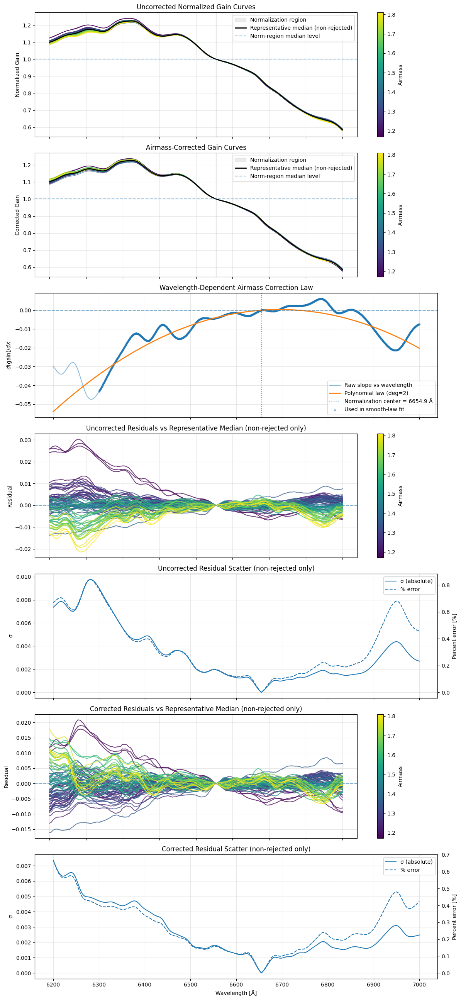

In [28]:
results =  derive_airmass_gain_correction(
    HR3454_2026_04_18_spectra,
    fit_targets=['HR 3454'],
    apply_targets=['HR 3454'],
    normalize = True,
    norm_region=(6654, 6656),
    wave_range=[(6300, 7000)],
    plot_range=[6200, 7000],
    degree=2,
    outlier_sigma=10,
    plot=True
)


Applied airmass-correction amplitudes:
  HR 3454: max |correction-1| ranges from 0.0000e+00 to 1.8199e-01
  HR 4963: max |correction-1| ranges from 2.4853e-03 to 1.9670e-01
  HR 4468: max |correction-1| ranges from 4.4044e-02 to 4.5085e-02


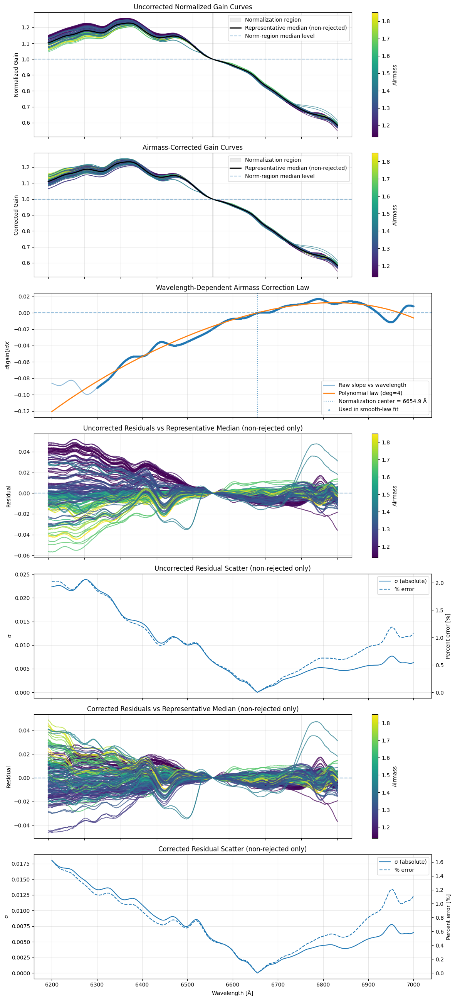


Applied airmass-correction amplitudes:
  HR 3454: max |correction-1| ranges from 0.0000e+00 to 1.6717e-01
  HR 4963: max |correction-1| ranges from 5.5956e-03 to 2.3842e-01
  MIXED: max |correction-1| ranges from 7.8380e-03 to 9.4622e-02


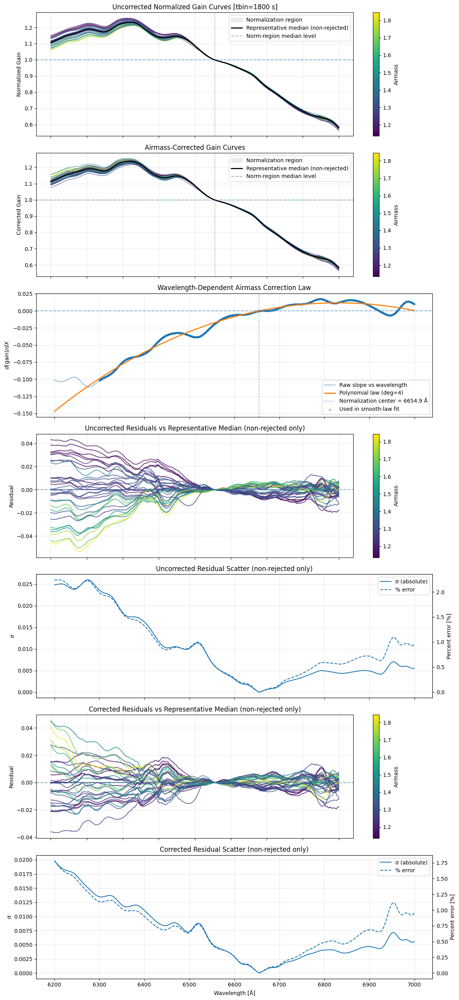

In [29]:
results = derive_airmass_gain_correction(
    QHY_calib_spectra,
    fit_targets=['HR 3454', 'HR 4468', 'HR 4963'],
    apply_targets=['HR 3454', 'HR 4468', 'HR 4963'],
    norm_region=(6654, 6656),
    wave_range=[(6300, 7000)],
    plot_range=[6200, 7000],
    degree=4,
    outlier_sigma=5,
    plot=True,
)

results = derive_airmass_gain_correction(
    QHY_calib_spectra,
    fit_targets=['HR 3454', 'HR 4468', 'HR 4963'],
    apply_targets=['HR 3454', 'HR 4468', 'HR 4963'],
    norm_region=(6654, 6656),
    wave_range=[(6300, 7000)],
    plot_range=[6200, 7000],
    degree=4,
    outlier_sigma=5,
    plot=True,
    tbin = 1800
)


Applied airmass-correction amplitudes:
  HR 3454: max |correction-1| ranges from 5.5456e-04 to 1.8959e-01


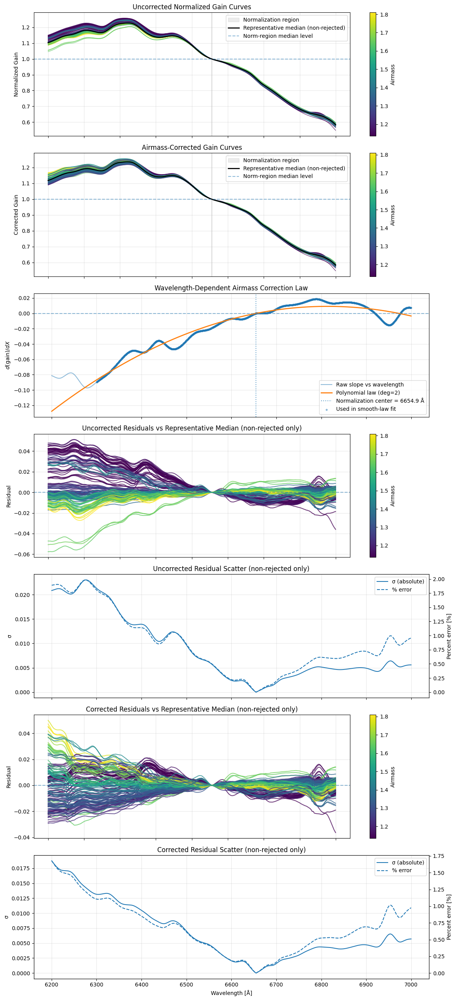


Applied airmass-correction amplitudes:
  HR 4468: max |correction-1| ranges from 2.7005e-02 to 2.7005e-02


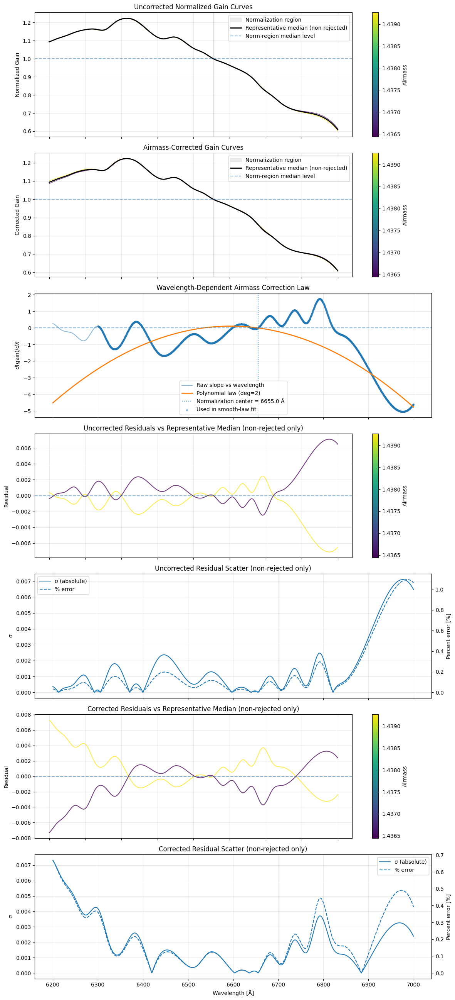


Applied airmass-correction amplitudes:
  HR 4963: max |correction-1| ranges from 0.0000e+00 to 1.6384e-01


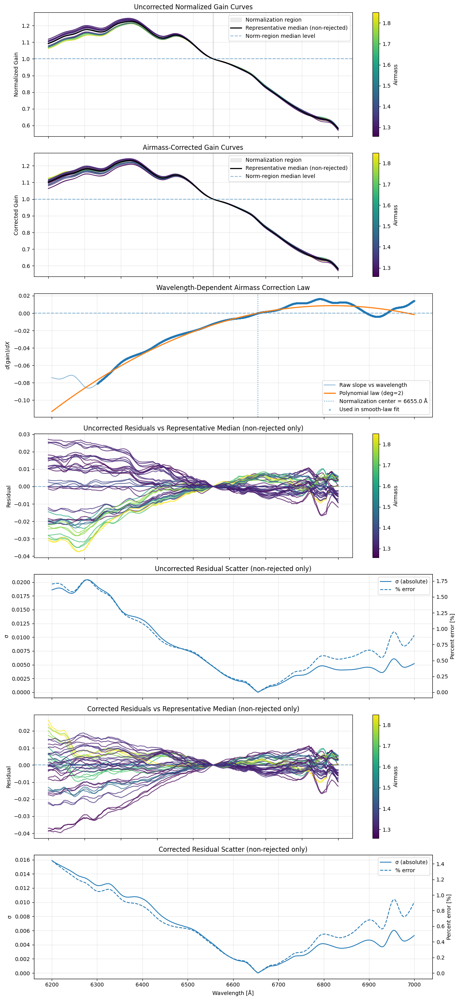

In [30]:
airmass_results = {}

# airmass_results['HR 718'] = derive_airmass_gain_correction(
#     QHY_calib_spectra,
#     fit_targets=['HR 718'],
#     apply_targets=['HR 718'],
#     norm_region=(6654, 6656),
#     wave_range=[(6300, 7000)],
#     plot_range=[6200, 7000],
#     degree=2,
#     outlier_sigma=8,
#     plot=True
# )

airmass_results['HR 3454'] = derive_airmass_gain_correction(
    QHY_calib_spectra,
    fit_targets=['HR 3454'],
    apply_targets=['HR 3454'],
    norm_region=(6654, 6656),
    wave_range=[(6300, 7000)],
    plot_range=[6200, 7000],
    degree=2,
    outlier_sigma=10,
    plot=True
)

airmass_results['HR 4468'] = derive_airmass_gain_correction(
    QHY_calib_spectra,
    fit_targets=['HR 4468'],
    apply_targets=['HR 4468'],
    norm_region=(6654, 6656),
    wave_range=[(6300,7000)],
    plot_range=[6200, 7000],
    degree=2,
    outlier_sigma=3,
    plot=True
)

airmass_results['HR 4963'] = derive_airmass_gain_correction(
    QHY_calib_spectra,
    fit_targets=['HR 4963'],
    apply_targets=['HR 4963'],
    norm_region=(6654, 6656),
    wave_range=[(6300,7000)],
    plot_range=[6200, 7000],
    degree=2,
    outlier_sigma=8,
    plot=True
)

In [31]:
# goes as lambda to minus 4

airmass_results = {}

airmass_results['HR 718'] = derive_airmass_gain_correction(
    QHY_calib_spectra,
    fit_targets=['HR 718'],
    apply_targets=['HR 718'],
    norm_region=(6654, 6656),
    wave_range=[(6300, 7000)],
    plot_range=[6200, 7000],
    degree=4,
    outlier_sigma=8,
    plot=True
)

airmass_results['HR 3454'] = derive_airmass_gain_correction(
    QHY_calib_spectra,
    fit_targets=['HR 3454'],
    apply_targets=['HR 3454'],
    norm_region=(6654, 6656),
    wave_range=[(6300, 7000)],
    plot_range=[6200, 7000],
    degree=4,
    outlier_sigma=5,
    plot=True
)

airmass_results['HR 4468'] = derive_airmass_gain_correction(
    QHY_calib_spectra,
    fit_targets=['HR 4468'],
    apply_targets=['HR 4468'],
    norm_region=(6654, 6656),
    wave_range=[(6300,7000)],
    plot_range=[6200, 7000],
    degree=4,
    outlier_sigma=3,
    plot=True
)

airmass_results['HR 4963'] = derive_airmass_gain_correction(
    QHY_calib_spectra,
    fit_targets=['HR 4963'],
    apply_targets=['HR 4963'],
    norm_region=(6654, 6656),
    wave_range=[(6300,7000)],
    plot_range=[6200, 7000],
    degree=4,
    outlier_sigma=8,
    plot=True
)

ValueError: Need at least two valid spectra in fit_targets to derive an airmass correction.

## Extract + Calibrate Science Spectra

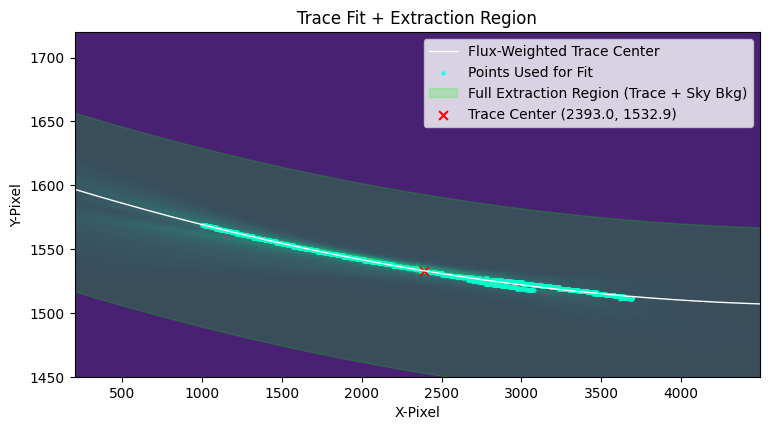

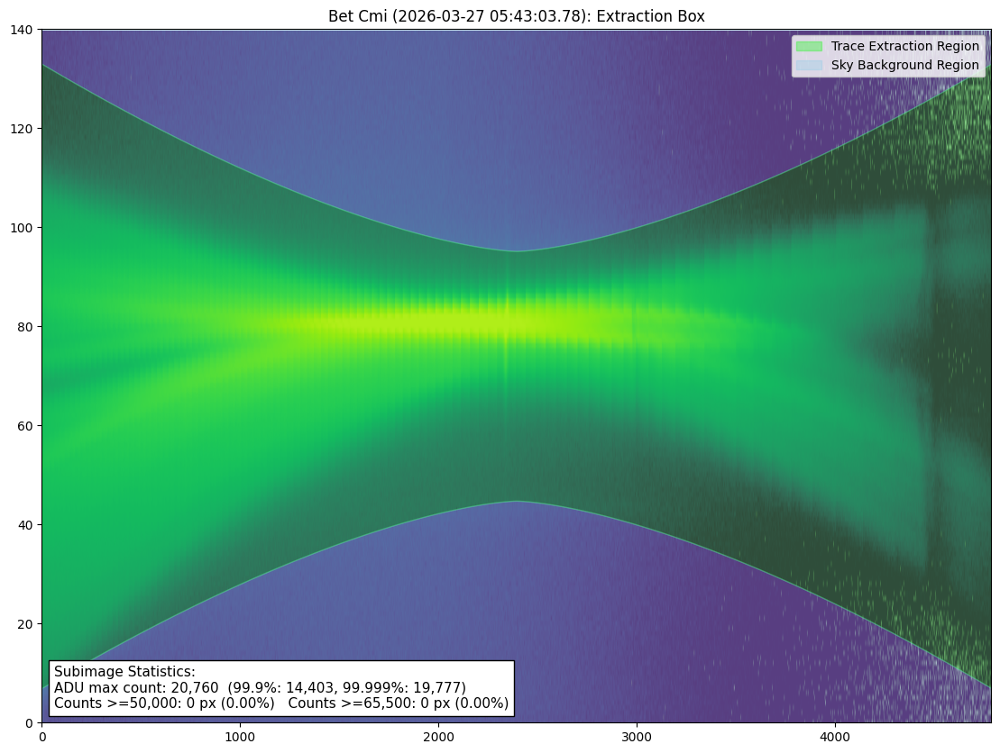

/Users/joshuamarine/Desktop/Code/Be-Stars/grism_utils_v2.py:928: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


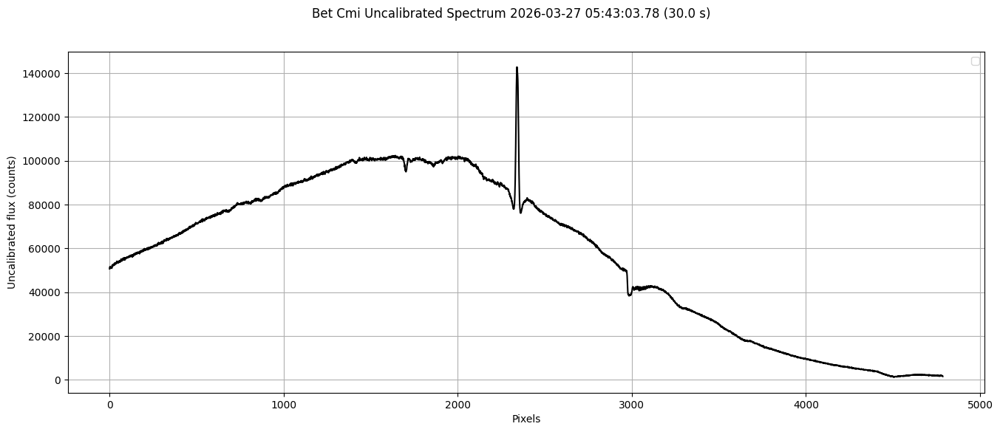

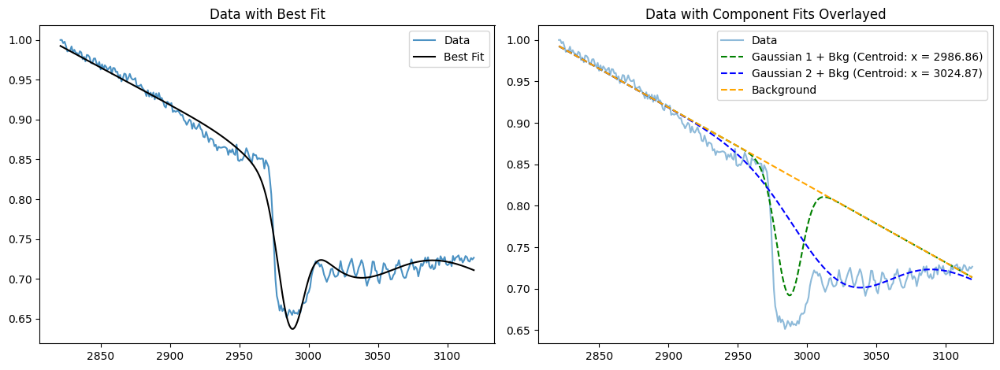

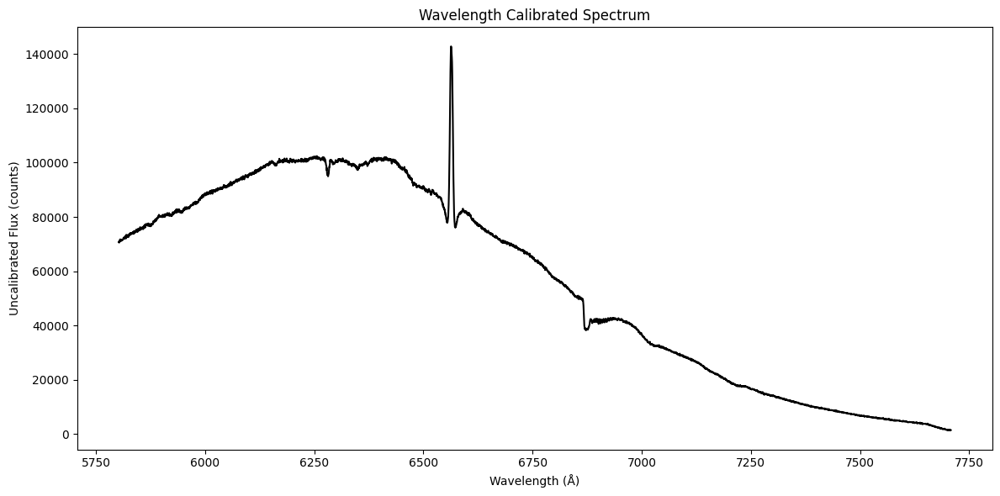

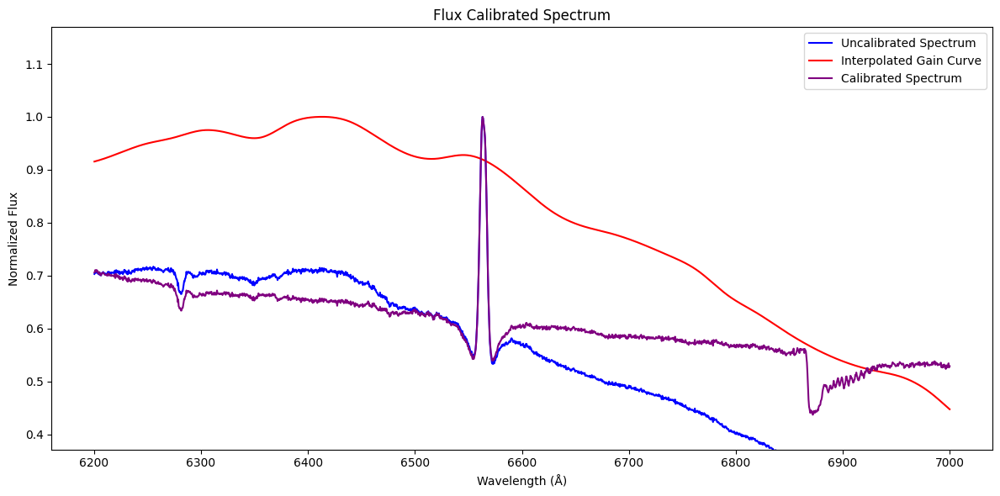

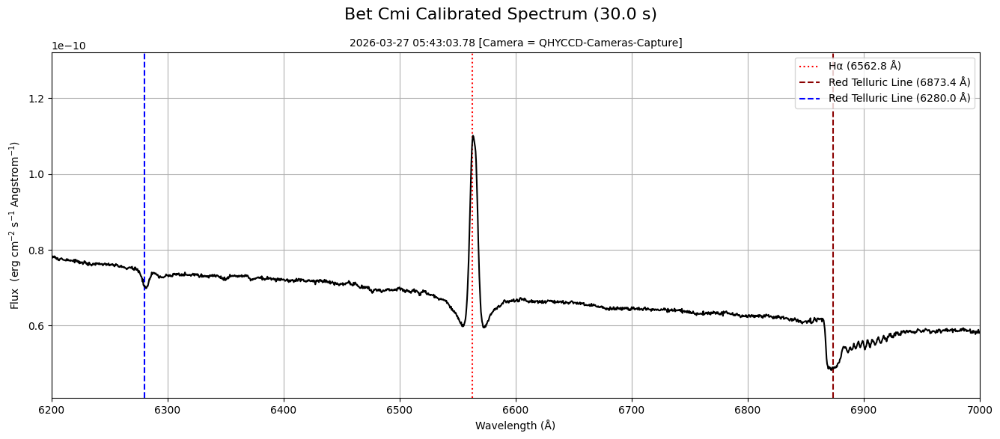

In [107]:
i = 100

match = calib_match_spectrum(img_files[i], QHY_calib_spectra)

S = spectrum(img_files[i], match, filter)

S.remove_hot_pixels(readnoise = 3, niter = 4)
trace_center, cutouts, subim = S.fit_trace(plot = True, curved = True, show_points = True)
spec = S.extract_spectrum(extract_percent = 90, show_box = True, plot = True, curved_box = True, curve_power = 1.5)
telluric_pixel = S.fit_telluric(plot = True, debugging = False)
# telluric_pixel = S.fit_telluric(x_guess = 3000, plot = True, debugging = False, manual_override = True)
# print(telluric_pixel)
waves = S.wavelength_calibrate(plot = True)
cal_spec = S.gain_calibrate(plot = True)
fig = S.plot_spectrum(xaxis = 'wavelength', yaxis = 'cal', plot_balmer = True)

In [ ]:
spectra = []

i = 0

for grism_image in img_files:

    match = calib_match_spectrum(img_files[i], QHY_calib_spectra)

    S = spectrum(img_files[i], calib_spectrum = match, filter = filter)

    print('')
    print(f'Processing image {i + 1} of {len(img_files)}: {S.object_name} {S.obs_date} ({S.exp_time} s):')
    print('')
    i += 1

    try:
        trace_center, cutouts, subim = S.fit_trace(plot = False, curved = True)
        spec = S.extract_spectrum(extract_percent = 95, show_box = False, plot = False, curved_box = True, curve_power = 1.5)
        telluric_pixel = S.fit_telluric(plot = False)
        # print(telluric_pixel)
        waves = S.wavelength_calibrate(plot = False)
        cal_spec = S.gain_calibrate(plot = False)
        # fig = S.plot_spectrum(xaxis = 'wavelength', yaxis = 'cal', plot_balmer = True)
        spectra.append(S)
    except:
        S.flagged = True
        spectra.append(S)
        continue

# All Done!

Now let's output a pdf file of the results

In [ ]:
# Wrap all class functions into parent function that can have input parameters of select indices for manual entry or things like that
# Have function output flagged spectra to rerun
# Run parent function in for loop for all targets to process all data
# Save final data as csv with column entries for telluric pixel entry 
# Create conditional to pull from existing csv or default if not csv
# Create manual entry conditional for if CSV already exists then do/don't overwrite
# Anytime you're reusing the same thing/attribute you want to possibly split that into different classes
  # This way if you make changes it propagates through fluidly
# For averaging, reinitialize spectrum class with only necessary attributes
# Initialize new class structure for output calibration parameters applied to science spectra

# ffmpeg
# matplotlib funcanimation

In [ ]:
# !!! Please paste in your last name here for saving output files !!!
username = 'Marine'


out_folder = os.getcwd() + '/calibrated_data/'
gdrive_out_folder = drive_path + '/calibrated_data/'

if os.path.exists(out_folder) and os.path.isdir(out_folder) and os.path.isdir(gdrive_out_folder):
    print("Directories exist, you're good to go!")
else:
    print("Directories do not exist, change your directories")

## (Optional) Look at Final Spectra

In [ ]:
# Show all the spectra again

for i in range(len(spectra)):
  spec = spectra[i]
  if spec.flagged:
    print(f'Skipping spectrum {i+1} of {len(spectra)}: {spec.grism_image} (Flagged)')
    continue
  print(f'Processing spectrum {i+1} of {len(spectra)}: {spec.grism_image}')
  print(f'Moon Angle & Phase: {spec.moonangle:.2f} degrees, {(spec.moonphase * 100):.2f} %')
  print(f'Telluric Line Pixel: {spec.telluric_pixel:.2f}')
  print(f'Calibration Telluric Line Pixel: {spec.calib_spectrum.telluric_pixel:.2f}')

  # fig = spec.plot_spectrum(xaxis = 'wavelength', yaxis = 'cal', plot_balmer = True)

## Save CSVs and PDFs Locally

In [ ]:
from matplotlib.backends.backend_pdf import PdfPages

# Define the output PDF file
pdf_filename = out_folder + f"{username}_{targets[0]}_{filter}_calibrated_spectra.pdf"

# Check if the file exists and notify about overwriting
if os.path.exists(pdf_filename):
    print(f"The file '{pdf_filename}' already exists and will be overwritten.")

# Create a PDF object to store plots
with PdfPages(pdf_filename) as pdf:
    for i in range(len(spectra)):
        spec = spectra[i]
        print(f'Processing spectrum {i+1} of {len(spectra)}: {spec.grism_image}')

        if spec.flagged:
            continue

        fig = spec.plot_spectrum(xaxis = 'wavelength', yaxis = 'cal', plot_balmer = True, show = False)

        # Save the current figure to the PDF
        pdf.savefig(fig)
        plt.close()  # Close the plot to free memory

print(f"All plots saved to {pdf_filename}")

In [ ]:
# Write out CSV files
path = out_folder
folder_name = f'{targets[0]}_{filter}_calibrated_csvs'
output_dir = os.path.join(path, folder_name)

# --- Replace the whole folder if it already exists ---
if os.path.exists(output_dir):
    print(f"⚠️  Folder already exists — deleting and recreating: {output_dir}")
    shutil.rmtree(output_dir)
os.makedirs(output_dir, exist_ok=True)

for i, spec in enumerate(spectra):
    
    if spec.flagged:
        continue
    # ----------------------------
    # Calibrated spectrum
    # ----------------------------
    waves = spec.waves
    flux  = spec.cal_spec

    dataframe = pd.DataFrame({
        "Wavelength": waves,
        "Flux": flux
    })

    img_name = img_files[i].split("/")[-1].replace(".fts.fz", ".csv")
    output_path = os.path.join(output_dir, f'{username}_{img_name}')

    if os.path.exists(output_path):
        print(f"Overwriting existing file: {output_path}")

    dataframe.to_csv(output_path, index=False)

    # ----------------------------
    # Normalized spectrum
    # ----------------------------
    if hasattr(spec, "cal_spec_norm"):
        flux_norm = spec.cal_spec_norm
    else:
        # fallback: normalize on the fly
        flux_norm = flux / np.median(flux)

    dataframe_norm = pd.DataFrame({
        "Wavelength": waves,
        "Flux": flux_norm
    })

    img_name_norm = img_files[i].split("/")[-1].replace(".fts.fz", "_norm.csv")
    output_path_norm = os.path.join(output_dir, f'{username}_{img_name_norm}')

    if os.path.exists(output_path_norm):
        print(f"Overwriting existing file: {output_path_norm}")

    dataframe_norm.to_csv(output_path_norm, index=False)

print(f"\nCSV files have been successfully written to {output_dir}")

## Save CSVs and PDFs to Google Drive (Mounted only)

In [ ]:
gdrive_pdf_filename = gdrive_out_folder + f"{username}_{targets[0]}_calibrated_spectra.pdf"

# Check if the file exists and notify about overwriting
if os.path.exists(gdrive_pdf_filename):
    print(f"The file '{gdrive_pdf_filename}' already exists and will be overwritten.")

# Create a PDF object to store plots
with PdfPages(gdrive_pdf_filename) as pdf:
    for i in range(len(spectra)):
        spec = spectra[i]
        print(f'Processing spectrum {i+1} of {len(spectra)}: {spec.grism_image}')

        if spec.flagged:
            continue

        fig = spec.plot_spectrum(xaxis = 'wavelength', yaxis = 'cal', plot_balmer = True, show = False)

        # Save the current figure to the PDF
        pdf.savefig(fig)
        plt.close()  # Close the plot to free memory

print(f"All plots saved to {gdrive_pdf_filename}")


In [ ]:
# Write out CSV files to google drive
path = out_folder
folder_name = f'{targets[0]}_{filter}_calibrated_csvs'
output_dir = os.path.join(gdrive_out_folder, folder_name)

# --- Replace the whole folder if it already exists ---
if os.path.exists(output_dir):
    print(f"⚠️  Folder already exists — deleting and recreating: {output_dir}")
    shutil.rmtree(output_dir)
os.makedirs(output_dir, exist_ok=True)

for i, spec in enumerate(spectra):

    if spec.flagged:
        continue
    # ----------------------------
    # Calibrated spectrum
    # ----------------------------
    waves = spec.waves
    flux  = spec.cal_spec

    dataframe = pd.DataFrame({
        "Wavelength": waves,
        "Flux": flux
    })

    img_name = img_files[i].split("/")[-1].replace(".fts.fz", ".csv")
    output_path = os.path.join(output_dir, f'{username}_{img_name}')

    if os.path.exists(output_path):
        print(f"Overwriting existing file: {output_path}")

    dataframe.to_csv(output_path, index=False)

    # ----------------------------
    # Normalized spectrum
    # ----------------------------
    if hasattr(spec, "cal_spec_norm"):
        flux_norm = spec.cal_spec_norm
    else:
        # fallback: normalize on the fly
        flux_norm = flux / np.median(flux)

    dataframe_norm = pd.DataFrame({
        "Wavelength": waves,
        "Flux": flux_norm
    })

    img_name_norm = img_files[i].split("/")[-1].replace(".fts.fz", "_norm.csv")
    output_path_norm = os.path.join(output_dir, f'{username}_{img_name_norm}')

    if os.path.exists(output_path_norm):
        print(f"Overwriting existing file: {output_path_norm}")

    dataframe_norm.to_csv(output_path_norm, index=False)

print(f"\nCSV files have been successfully written to {output_dir}")